<a href="https://colab.research.google.com/github/Tiwari666/Classification_Model/blob/main/Classification_Algorithm_Customer_Churn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **1) Importing Basic Libraries**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# **2) Importing dataset**

In [ ]:
df = pd.read_csv('/content/UpdatedBankChurners.csv')
df.head(2)


,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45.0,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49.0,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105


# **3) Dataset exploration:**

In [ ]:
# Checking the number of rows and columns in the data
df.shape

(10127, 21)

#The dataset has 10127 rows and 23 columns.

In [ ]:
# let's create a copy of the data
data = df.copy()

In [ ]:
data.isnull().sum()

CLIENTNUM                   0
Attrition_Flag              0
Customer_Age                5
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

#We can see that Customer_Age  column has 5 null values i.e. column has missing values.

# **4) Exploratory Data Analysis (EDA)**

In [ ]:
# let's check the data types of the columns in the dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10122 non-null  float64
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           10127 non-null  object 
 6   Marital_Status            10127 non-null  object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

In [ ]:
# let's check for duplicate values in the data
data.duplicated().sum()

0

In [ ]:
duplicate_rows = data[data.duplicated(subset = ['CLIENTNUM','Gender', 'Education_Level'], keep = False)]
duplicate_rows.count()

CLIENTNUM                   0
Attrition_Flag              0
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

In [ ]:
# print uniques
data.nunique()

CLIENTNUM                   10127
Attrition_Flag                  2
Customer_Age                   45
Gender                          2
Dependent_count                 6
Education_Level                 7
Marital_Status                  4
Income_Category                 6
Card_Category                   4
Months_on_book                 44
Total_Relationship_Count        6
Months_Inactive_12_mon          7
Contacts_Count_12_mon           7
Credit_Limit                 6205
Total_Revolving_Bal          1974
Avg_Open_To_Buy              6813
Total_Amt_Chng_Q4_Q1         1158
Total_Trans_Amt              5033
Total_Trans_Ct                126
Total_Ct_Chng_Q4_Q1           830
Avg_Utilization_Ratio         964
dtype: int64

In [ ]:
# print uniques
data['Attrition_Flag'].unique()

array(['Existing Customer', 'Attrited Customer'], dtype=object)

In [ ]:
# print nuniques
data['Attrition_Flag'].nunique()

2

In [ ]:
#It gives the total number of rows including the null and not-null values
data.isnull().count()

CLIENTNUM                   10127
Attrition_Flag              10127
Customer_Age                10127
Gender                      10127
Dependent_count             10127
Education_Level             10127
Marital_Status              10127
Income_Category             10127
Card_Category               10127
Months_on_book              10127
Total_Relationship_Count    10127
Months_Inactive_12_mon      10127
Contacts_Count_12_mon       10127
Credit_Limit                10127
Total_Revolving_Bal         10127
Avg_Open_To_Buy             10127
Total_Amt_Chng_Q4_Q1        10127
Total_Trans_Amt             10127
Total_Trans_Ct              10127
Total_Ct_Chng_Q4_Q1         10127
Avg_Utilization_Ratio       10127
dtype: int64

In [ ]:
data.count() # It gives only the number of not-null values.

CLIENTNUM                   10127
Attrition_Flag              10127
Customer_Age                10122
Gender                      10127
Dependent_count             10127
Education_Level             10127
Marital_Status              10127
Income_Category             10127
Card_Category               10127
Months_on_book              10127
Total_Relationship_Count    10127
Months_Inactive_12_mon      10127
Contacts_Count_12_mon       10127
Credit_Limit                10127
Total_Revolving_Bal         10127
Avg_Open_To_Buy             10127
Total_Amt_Chng_Q4_Q1        10127
Total_Trans_Amt             10127
Total_Trans_Ct              10127
Total_Ct_Chng_Q4_Q1         10127
Avg_Utilization_Ratio       10127
dtype: int64

In [ ]:
data.isnull().sum() # It gives only the null(missing) values.

CLIENTNUM                   0
Attrition_Flag              0
Customer_Age                5
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

In [ ]:
# let's check for missing values in the data
round(data.isnull().sum() / data.isnull().count() * 100, 2)

CLIENTNUM                   0.00
Attrition_Flag              0.00
Customer_Age                0.05
Gender                      0.00
Dependent_count             0.00
Education_Level             0.00
Marital_Status              0.00
Income_Category             0.00
Card_Category               0.00
Months_on_book              0.00
Total_Relationship_Count    0.00
Months_Inactive_12_mon      0.00
Contacts_Count_12_mon       0.00
Credit_Limit                0.00
Total_Revolving_Bal         0.00
Avg_Open_To_Buy             0.00
Total_Amt_Chng_Q4_Q1        0.00
Total_Trans_Amt             0.00
Total_Trans_Ct              0.00
Total_Ct_Chng_Q4_Q1         0.00
Avg_Utilization_Ratio       0.00
dtype: float64

In [ ]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
CLIENTNUM,10127.0,7.391776e+08,3.690378e+07,708082083.0,7.130368e+08,7.179264e+08,7.731435e+08,8.283431e+08
Customer_Age,10122.0,4.632464e+01,8.016195e+00,26.0,4.100000e+01,4.600000e+01,5.200000e+01,7.300000e+01
Dependent_count,10127.0,2.346203e+00,1.298908e+00,0.0,1.000000e+00,2.000000e+00,3.000000e+00,5.000000e+00
Months_on_book,10127.0,3.592841e+01,7.986416e+00,13.0,3.100000e+01,3.600000e+01,4.000000e+01,5.600000e+01
Total_Relationship_Count,10127.0,3.812580e+00,1.554408e+00,1.0,3.000000e+00,4.000000e+00,5.000000e+00,6.000000e+00
Months_Inactive_12_mon,10127.0,2.341167e+00,1.010622e+00,0.0,2.000000e+00,2.000000e+00,3.000000e+00,6.000000e+00
Contacts_Count_12_mon,10127.0,2.455317e+00,1.106225e+00,0.0,2.000000e+00,2.000000e+00,3.000000e+00,6.000000e+00
Credit_Limit,10127.0,8.631954e+03,9.088777e+03,1438.3,2.555000e+03,4.549000e+03,1.106750e+04,3.451600e+04
Total_Revolving_Bal,10127.0,1.162814e+03,8.149873e+02,0.0,3.590000e+02,1.276000e+03,1.784000e+03,2.517000e+03
Avg_Open_To_Buy,10127.0,7.469140e+03,9.090685e+03,3.0,1.324500e+03,3.474000e+03,9.859000e+03,3.451600e+04


In [ ]:
# let's view the statistical summary of the non-numerical columns in the data
data.describe(exclude=np.number).T

,count,unique,top,freq
Attrition_Flag,10127,2,Existing Customer,8500
Gender,10127,2,F,5358
Education_Level,10127,7,Graduate,3128
Marital_Status,10127,4,Married,4687
Income_Category,10127,6,Less than $40K,3561
Card_Category,10127,4,Blue,9436


In [ ]:
# Create a crosstab of Income_Category  and Card_Category
cross_tab = pd.crosstab(data['Income_Category'], data['Card_Category'])

print(cross_tab)

Card_Category    Blue  Gold  Platinum  Silver
Income_Category                              
$120K +           645    18         4      60
$40K - $60K      1675    15         1      99
$60K - $80K      1273    29         4      96
$80K - $120K     1395    21         2     117
Less than $40K   3403    24         4     130
Unknown          1045     9         5      53


In [ ]:
duplicate_rows = data[data.duplicated(subset = ['CLIENTNUM','Gender', 'Education_Level'], keep = False)]
duplicate_rows.count()

CLIENTNUM                   0
Attrition_Flag              0
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

In [ ]:
pd.pivot_table(data,values = 'Credit_Limit', index = "Income_Category", columns = 'Gender', aggfunc = 'mean',fill_value = data["Credit_Limit"].mean())

Gender,F,M
Income_Category,,
$120K +,8631.953698,19717.322558
$40K - $60K,4813.705227,6309.726804
$60K - $80K,8631.953698,10758.772967
$80K - $120K,8631.953698,15809.890945
Less than $40K,3684.819945,4579.371119
Unknown,9373.363585,12436.044231


In [ ]:
#pd.pivot_table(data,values = 'Credit_Limit', index = "Income_Category", columns = 'Gender', aggfunc = 'mean',fill_value = data["Credit_Limit"].median())

#Data Cleaning:

Here, one can drop the column - CLIENTNUM, as it is the unique number for each customer and will not add any value to the model.

In [ ]:
# Dropping column - ID
data.drop(columns=["CLIENTNUM"], inplace=True)

In [ ]:
data

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45.0,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49.0,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51.0,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,Existing Customer,40.0,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,Existing Customer,40.0,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,Existing Customer,50.0,M,2,Graduate,Single,$40K - $60K,Blue,40,3,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462
10123,Attrited Customer,41.0,M,2,Unknown,Divorced,$40K - $60K,Blue,25,4,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511
10124,Attrited Customer,44.0,F,1,High School,Married,Less than $40K,Blue,36,5,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000
10125,Attrited Customer,30.0,M,2,Graduate,Unknown,$40K - $60K,Blue,36,4,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000


# Working on Categorical columns:

In [ ]:
# Making a list of all catrgorical variables
cat_col = data.select_dtypes("object").columns.to_list()
cat_col

['Attrition_Flag',
 'Gender',
 'Education_Level',
 'Marital_Status',
 'Income_Category',
 'Card_Category']

In [ ]:
# Printing number of count of each unique value in each column
for column in cat_col:
    print(data[column].value_counts())
    print("*" * 50) # printing 50 *** after each iteration

Existing Customer    8500
Attrited Customer    1627
Name: Attrition_Flag, dtype: int64
**************************************************
F    5358
M    4769
Name: Gender, dtype: int64
**************************************************
Graduate         3128
High School      2013
Unknown          1519
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: Education_Level, dtype: int64
**************************************************
Married     4687
Single      3943
Unknown      749
Divorced     748
Name: Marital_Status, dtype: int64
**************************************************
Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
Unknown           1112
$120K +            727
Name: Income_Category, dtype: int64
**************************************************
Blue        9436
Silver       555
Gold         116
Platinum      20
Name: Card_Category, dtype: int64
******************************************

In [ ]:
# Get value counts
df["Attrition_Flag"].value_counts(normalize=True)

Existing Customer    0.83934
Attrited Customer    0.16066
Name: Attrition_Flag, dtype: float64

The analysis shows that there are more female customers as compared to male customers.

There is a few observations of Platinum Card holders (20). So, we can merge those number with the "Gold" card category.

Importantly, one can see that the distribution of classes in the target variable is imbalanced i.e. only ~16% observations with existing customers (non-attritees).

#Replace incorrect data entry values with an imputed mode.

#Income Category

In [ ]:
# subset to view incorrect values
data[data.Income_Category == "Unknown"]

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
19,Existing Customer,45.0,F,2,Graduate,Married,Unknown,Blue,37,6,1,2,14470.0,1157,13313.0,0.966,1207,21,0.909,0.080
28,Existing Customer,NaN,F,3,Uneducated,Single,Unknown,Blue,34,5,2,2,10100.0,0,10100.0,0.525,1052,18,1.571,0.000
39,Attrited Customer,66.0,F,0,Doctorate,Married,Unknown,Blue,56,5,4,3,7882.0,605,7277.0,1.052,704,16,0.143,0.077
44,Existing Customer,38.0,F,4,Graduate,Single,Unknown,Blue,28,2,3,3,9830.0,2055,7775.0,0.977,1042,23,0.917,0.209
58,Existing Customer,44.0,F,5,Graduate,Married,Unknown,Blue,35,4,1,2,6273.0,978,5295.0,2.275,1359,25,1.083,0.156
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10021,Attrited Customer,30.0,F,1,Graduate,Married,Unknown,Blue,18,4,1,4,4377.0,2517,1860.0,0.941,8759,74,0.609,0.575
10040,Attrited Customer,50.0,F,3,Doctorate,Single,Unknown,Blue,36,4,3,3,5173.0,0,5173.0,0.912,8757,68,0.789,0.000
10083,Existing Customer,42.0,F,4,Uneducated,Married,Unknown,Blue,23,4,1,2,8348.0,0,8348.0,0.695,15905,111,0.708,0.000
10092,Attrited Customer,40.0,F,3,Graduate,Married,Unknown,Blue,25,1,2,3,6888.0,1878,5010.0,1.059,9038,64,0.829,0.273


In [ ]:
# replace  missing values ( unKnown values) with nan
data.Income_Category.replace(to_replace="Unknown", value=np.nan, inplace=True)

In [ ]:
# subset to view incorrect values
data[data.Income_Category == "Unknown"]

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio


In [ ]:
'Unknown' in data["Income_Category"] # Another way of checking unknown values in the Income_category column

False

In [ ]:
# checking value replacement
data.Income_Category.value_counts()

Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
$120K +            727
Name: Income_Category, dtype: int64

In [ ]:
# imputing NaN by the mode of Income_Category onto missing values
data.Income_Category = data.Income_Category.fillna(
    value=data["Income_Category"].value_counts().index[0])
data.Income_Category

0           $60K - $80K
1        Less than $40K
2          $80K - $120K
3        Less than $40K
4           $60K - $80K
              ...      
10122       $40K - $60K
10123       $40K - $60K
10124    Less than $40K
10125       $40K - $60K
10126    Less than $40K
Name: Income_Category, Length: 10127, dtype: object

In [ ]:
# checking to see value replacement
data.Income_Category.value_counts()

Less than $40K    4673
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
$120K +            727
Name: Income_Category, dtype: int64

#EDUCATION_LEVEL:


In [ ]:
# subset to view incorrect values
data[data.Education_Level == "Unknown"]

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
6,Existing Customer,51.0,M,4,Unknown,Married,$120K +,Gold,46,6,1,3,34516.0,2264,32252.0,1.975,1330,31,0.722,0.066
11,Existing Customer,65.0,M,1,Unknown,Married,$40K - $60K,Blue,54,6,2,3,9095.0,1587,7508.0,1.433,1314,26,1.364,0.174
15,Existing Customer,44.0,M,4,Unknown,Unknown,$80K - $120K,Blue,37,5,1,2,4234.0,972,3262.0,1.707,1348,27,1.700,0.230
17,Existing Customer,41.0,M,3,Unknown,Married,$80K - $120K,Blue,34,4,4,1,13535.0,1291,12244.0,0.653,1028,21,1.625,0.095
23,Existing Customer,47.0,F,4,Unknown,Single,Less than $40K,Blue,36,3,3,2,2492.0,1560,932.0,0.573,1126,23,0.353,0.626
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10090,Existing Customer,36.0,F,3,Unknown,Married,$40K - $60K,Blue,22,5,3,3,12958.0,2273,10685.0,0.608,15681,96,0.627,0.175
10094,Existing Customer,59.0,M,1,Unknown,Single,$60K - $80K,Blue,48,3,1,2,7288.0,0,7288.0,0.640,14873,120,0.714,0.000
10095,Existing Customer,46.0,M,3,Unknown,Married,$80K - $120K,Blue,33,4,1,3,34516.0,1099,33417.0,0.816,15490,110,0.618,0.032
10118,Attrited Customer,50.0,M,1,Unknown,Unknown,$80K - $120K,Blue,36,6,3,4,9959.0,952,9007.0,0.825,10310,63,1.100,0.096


In [ ]:
# replace  missing values ( unKnown values) with nan
data.Education_Level.replace(to_replace="Unknown", value=np.nan, inplace=True)

In [ ]:
# subset to view incorrect values
data[data.Income_Category == "Unknown"]

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio


In [ ]:
data['Education_Level'].value_counts()

Graduate         3128
High School      2013
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: Education_Level, dtype: int64

In [ ]:
data.Education_Level.isnull().count()

10127

In [ ]:
data.Education_Level.unique()

array(['High School', 'Graduate', 'Uneducated', nan, 'College',
       'Post-Graduate', 'Doctorate'], dtype=object)

In [ ]:
data.Education_Level.isnull().sum()

1519

In [ ]:
# imputing NaN by the mode of Income_Category onto missing values
data.Education_Level = data.Education_Level.fillna(
    value=data['Education_Level'].value_counts().index[1])
data.Education_Level

0        High School
1           Graduate
2           Graduate
3        High School
4         Uneducated
            ...     
10122       Graduate
10123    High School
10124    High School
10125       Graduate
10126       Graduate
Name: Education_Level, Length: 10127, dtype: object

In [ ]:
# check value replacement
data.Education_Level.value_counts()

High School      3532
Graduate         3128
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: Education_Level, dtype: int64

In [ ]:
data.Education_Level.isnull().sum()

0

#'Marital_Status'

In [ ]:
# subset to view incorrect values
data[data.Marital_Status == "Unknown"]

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
3,Existing Customer,40.0,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
7,Existing Customer,32.0,M,0,High School,Unknown,$60K - $80K,Silver,27,2,2,2,29081.0,1396,27685.0,2.204,1538,36,0.714,0.048
10,Existing Customer,42.0,M,5,Uneducated,Unknown,$120K +,Blue,31,5,3,2,6748.0,1467,5281.0,0.831,1201,42,0.680,0.217
13,Existing Customer,35.0,M,3,Graduate,Unknown,$60K - $80K,Blue,30,5,1,3,8547.0,1666,6881.0,1.163,1311,33,2.000,0.195
15,Existing Customer,44.0,M,4,High School,Unknown,$80K - $120K,Blue,37,5,1,2,4234.0,972,3262.0,1.707,1348,27,1.700,0.230
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10070,Existing Customer,47.0,M,3,High School,Unknown,$80K - $120K,Silver,40,5,3,2,34516.0,1371,33145.0,0.691,15930,123,0.836,0.040
10100,Existing Customer,39.0,M,2,Graduate,Unknown,$60K - $80K,Silver,36,4,2,2,29808.0,0,29808.0,0.669,16098,128,0.684,0.000
10101,Existing Customer,42.0,M,2,Graduate,Unknown,$40K - $60K,Blue,30,3,2,5,3735.0,1723,2012.0,0.595,14501,92,0.840,0.461
10118,Attrited Customer,50.0,M,1,High School,Unknown,$80K - $120K,Blue,36,6,3,4,9959.0,952,9007.0,0.825,10310,63,1.100,0.096


In [ ]:
# replace  missing values ( unKnown values) with nan
data.Marital_Status.replace(to_replace="Unknown", value=np.nan, inplace=True)

In [ ]:
# check value replacement
data.Marital_Status.value_counts()  # it only counts the non-null values...

Married     4687
Single      3943
Divorced     748
Name: Marital_Status, dtype: int64

In [ ]:
data[data.Marital_Status == "Unknown"]

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio


In [ ]:
# imputing NaN by the mode of Income_Category onto missing values
data.Marital_Status = data.Marital_Status.fillna(
    value=data['Marital_Status'].value_counts().index[0])
data.Marital_Status

0         Married
1          Single
2         Married
3         Married
4         Married
           ...   
10122      Single
10123    Divorced
10124     Married
10125     Married
10126     Married
Name: Marital_Status, Length: 10127, dtype: object

In [ ]:
# check value replacement
data.Marital_Status.value_counts()

Married     5436
Single      3943
Divorced     748
Name: Marital_Status, dtype: int64

In [ ]:
data['Marital_Status'].isnull().sum()

0

#Card_Category

In [ ]:
data['Card_Category'].replace({'Gold': "Premium", "Platinum": "Premium"}, inplace = True)
data['Card_Category'].value_counts()

Blue       9436
Silver      555
Premium     136
Name: Card_Category, dtype: int64

# 'Customer_Age': Imputation

In [ ]:
data['Customer_Age'] = data['Customer_Age'].fillna(value = data['Customer_Age'].mean())

In [ ]:
from sklearn.impute import SimpleImputer # sklearn--library, impute= API, CLASS = SimpleImputer



imputer = SimpleImputer(missing_values = np.nan, strategy = 'mean')
data['Customer_Age'] = imputer.fit_transform(data['Customer_Age'].values.reshape(-1,1))
data.Customer_Age.isnull().sum()

0

In [ ]:
data['Customer_Age'].isnull().sum()

0

#Visualization:

In [ ]:
data.columns

Index(['Attrition_Flag', 'Customer_Age', 'Gender', 'Dependent_count',
       'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category',
       'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  object 
 1   Customer_Age              10127 non-null  float64
 2   Gender                    10127 non-null  object 
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           10127 non-null  object 
 5   Marital_Status            10127 non-null  object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  int64  
 14  Avg_Op

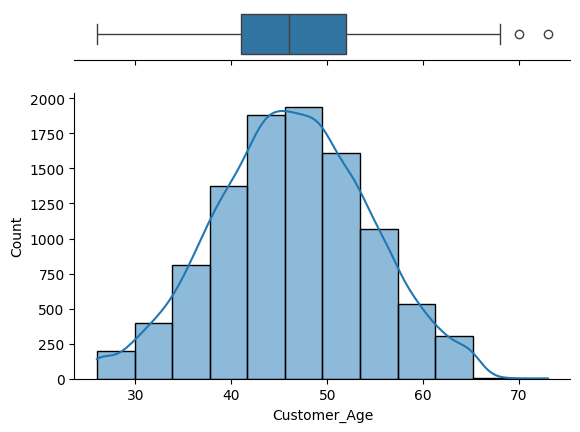

In [ ]:
import seaborn as sns
x = data['Customer_Age']

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})

sns.boxplot(x=x, ax=ax_box)
sns.histplot(x=x, bins=12, kde=True, stat='count', ax=ax_hist)

ax_box.set(yticks=[])
sns.despine(ax=ax_hist)
sns.despine(ax=ax_box, left=True)

The distribution of age is normal.

The boxplot shows that there are outliers at the right end.

We will not treat these outliers as they represent the real market trend.

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Attrition_Flag            10127 non-null  object 
 1   Customer_Age              10127 non-null  float64
 2   Gender                    10127 non-null  object 
 3   Dependent_count           10127 non-null  int64  
 4   Education_Level           10127 non-null  object 
 5   Marital_Status            10127 non-null  object 
 6   Income_Category           10127 non-null  object 
 7   Card_Category             10127 non-null  object 
 8   Months_on_book            10127 non-null  int64  
 9   Total_Relationship_Count  10127 non-null  int64  
 10  Months_Inactive_12_mon    10127 non-null  int64  
 11  Contacts_Count_12_mon     10127 non-null  int64  
 12  Credit_Limit              10127 non-null  float64
 13  Total_Revolving_Bal       10127 non-null  int64  
 14  Avg_Op

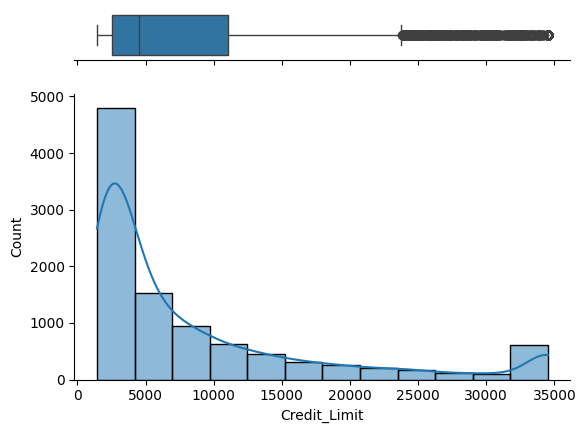

In [ ]:
import seaborn as sns
x = data['Credit_Limit']

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})

sns.boxplot(x=x, ax=ax_box)
sns.histplot(x=x, bins=12, kde=True, stat='count', ax=ax_hist)

ax_box.set(yticks=[])
sns.despine(ax=ax_hist)
sns.despine(ax=ax_box, left=True)

The distribution of the credit amount is right-skewed.

The boxplot shows that there are outliers at the right end.

We will not treat these outliers as they represent the real market trend.

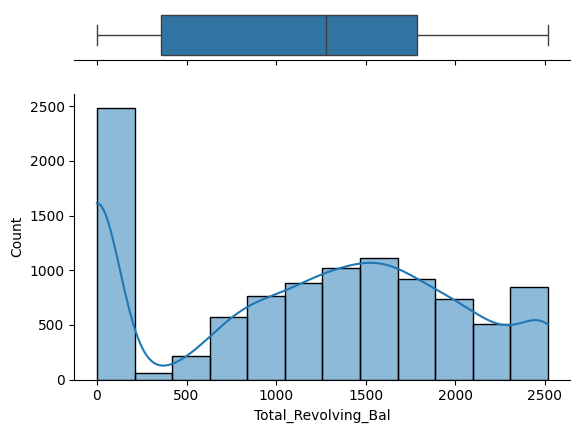

In [ ]:
import seaborn as sns
x = data['Total_Revolving_Bal']

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})

sns.boxplot(x=x, ax=ax_box)
sns.histplot(x=x, bins=12, kde=True, stat='count', ax=ax_hist)

ax_box.set(yticks=[])
sns.despine(ax=ax_hist)
sns.despine(ax=ax_box, left=True)

The distribution of the balance that carries over from one month to the next is the revolving balance for which the credit is given is somewhat normal.

The boxplot shows that there are outliers at the left end.

We will not treat these outliers as they represent the real market trend.

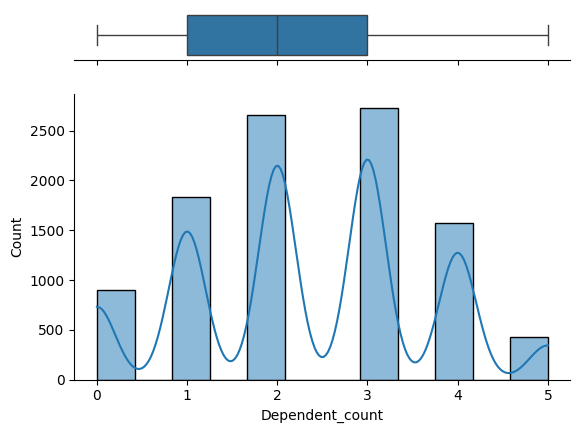

In [ ]:
import seaborn as sns
x = data['Dependent_count']

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})

sns.boxplot(x=x, ax=ax_box)
sns.histplot(x=x, bins=12, kde=True, stat='count', ax=ax_hist)

ax_box.set(yticks=[])
sns.despine(ax=ax_hist)
sns.despine(ax=ax_box, left=True)

In [ ]:
data['Attrition_Flag'].unique()

array(['Existing Customer', 'Attrited Customer'], dtype=object)

#Categorical: Univariate

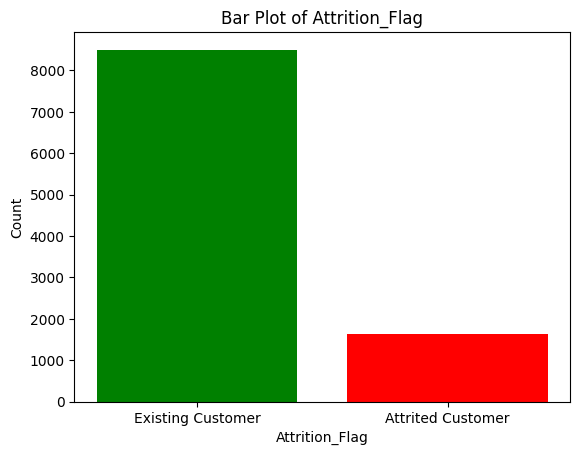

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

Attrition_Flag_counts = data['Attrition_Flag'].value_counts()

plt.bar(Attrition_Flag_counts.index, Attrition_Flag_counts, color=['green', 'red'])

# Add labels and title
plt.xlabel('Attrition_Flag')
plt.ylabel('Count')
plt.title('Bar Plot of Attrition_Flag')

plt.show()

In [ ]:
data.columns


Index(['Attrition_Flag', 'Customer_Age', 'Gender', 'Dependent_count',
       'Education_Level', 'Marital_Status', 'Income_Category', 'Card_Category',
       'Months_on_book', 'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')

In [ ]:
data['Education_Level'].unique()

array(['High School', 'Graduate', 'Uneducated', 'College',
       'Post-Graduate', 'Doctorate'], dtype=object)

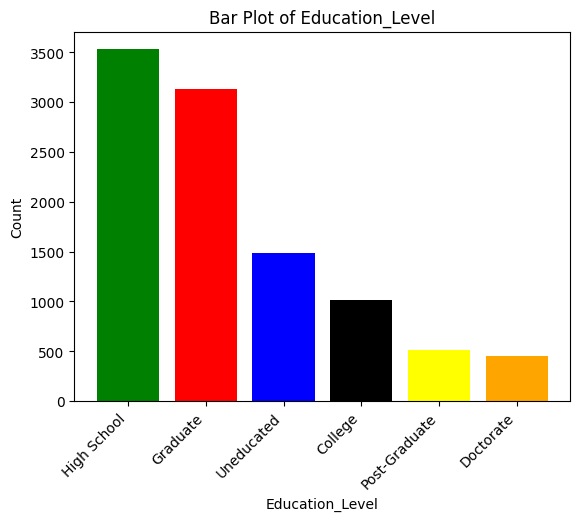

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

Education_Level_counts = data['Education_Level'].value_counts()

plt.bar(Education_Level_counts.index, Education_Level_counts, color=['green', 'red','blue', 'black', 'yellow', 'orange'])

# Add labels and title
plt.xlabel('Education_Level')
plt.ylabel('Count')
plt.title('Bar Plot of Education_Level')
# Rotate x-axis labels
plt.xticks(rotation=45, ha = 'right')
plt.show()

#Bivariate Analysis:

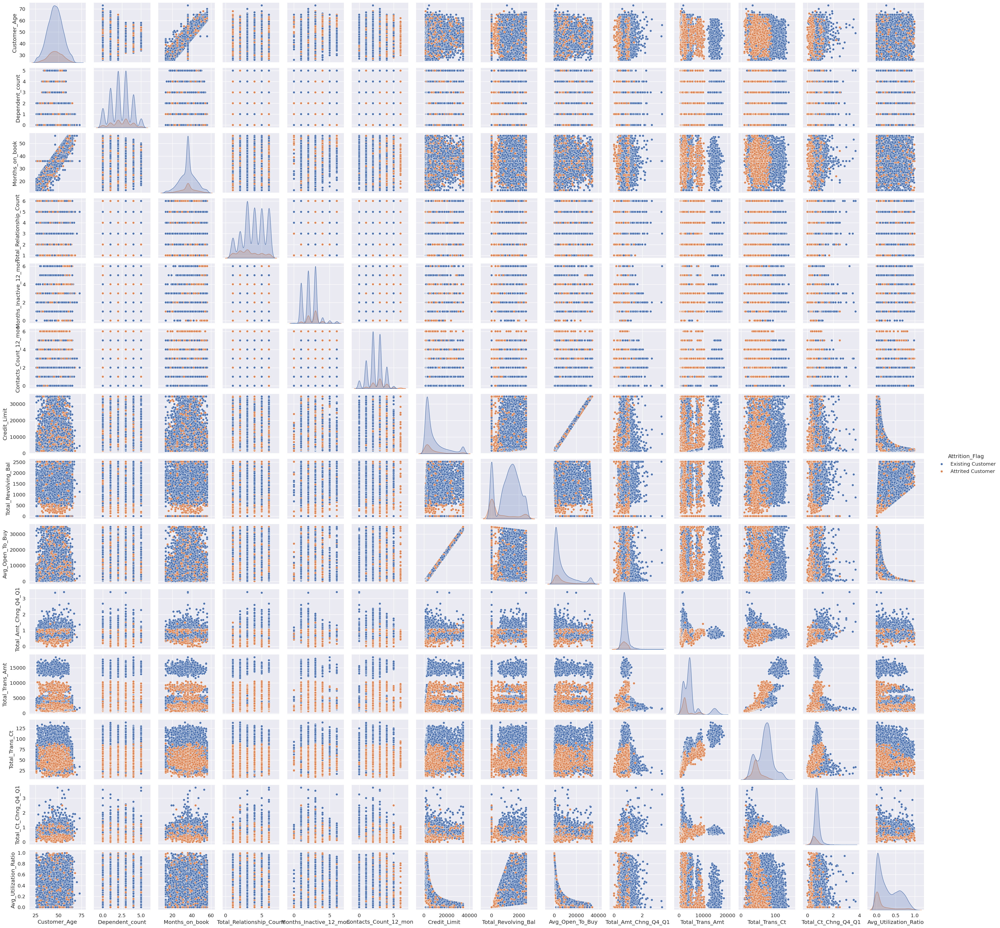

In [ ]:
# seaborn pairplot
sns.pairplot(data, hue="Attrition_Flag")

#Further explore of bivariate analysis one-by-one:

<Axes: xlabel='Attrition_Flag', ylabel='Customer_Age'>

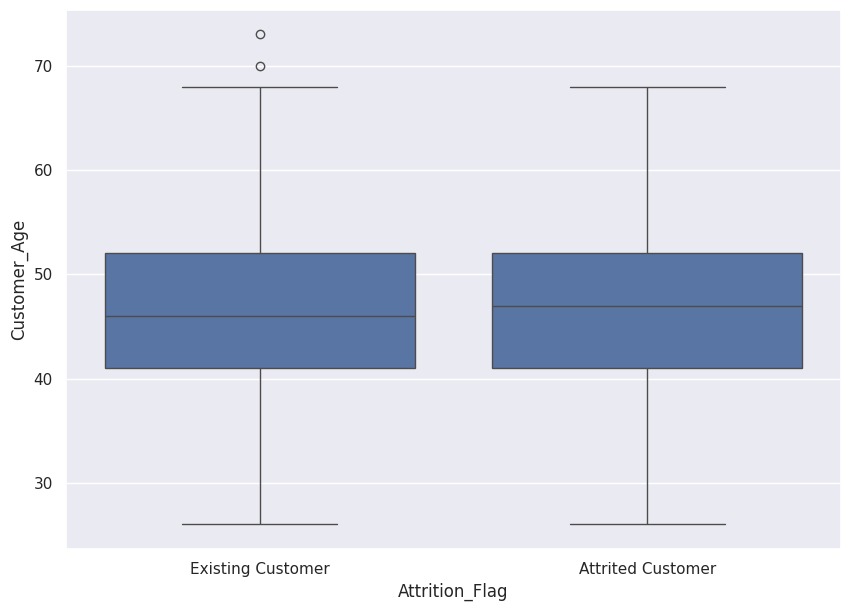

In [ ]:
# box plots on 2 variables
sns.set(rc={"figure.figsize": (10, 7)})
sns.boxplot(x="Attrition_Flag", y="Customer_Age", data=data, orient="vertical")

We can see that the median age of attritees is higher than the median age of non-attritees.

This shows that younger customers are more likely to stay as customers.

There are outliers in boxplots of only existing customers.

<Axes: xlabel='Customer_Age', ylabel='Proportion'>

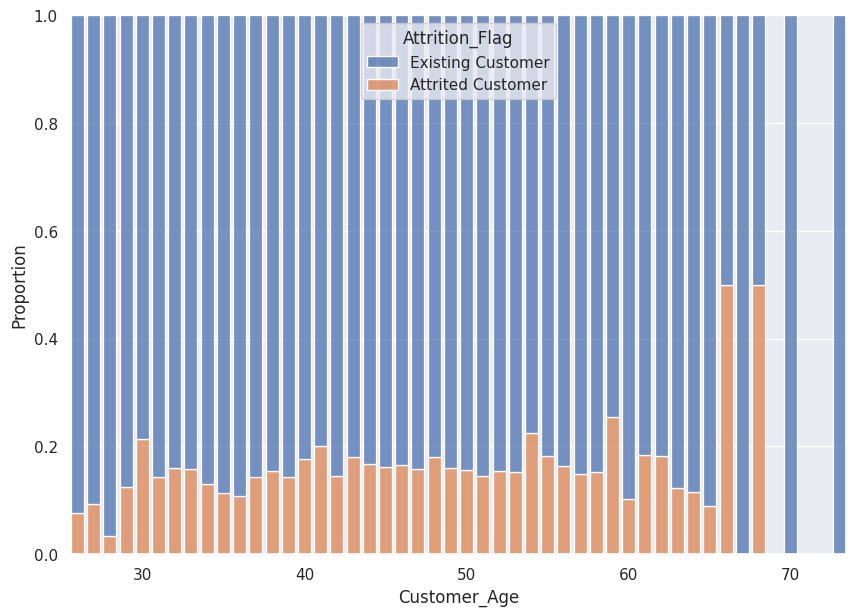

In [ ]:

sns.histplot(
    data=data,
    x="Customer_Age", hue="Attrition_Flag",
    multiple="fill", stat="proportion",
    discrete=True, shrink=.8)

We see how older customers tend to be existing customers. Younger people might be more prone to looking for new and better credit options.

40-year-olds take up the majority of the dataset.

43 - 48 year olds tended to attrite.

<Axes: xlabel='Card_Category', ylabel='Proportion'>

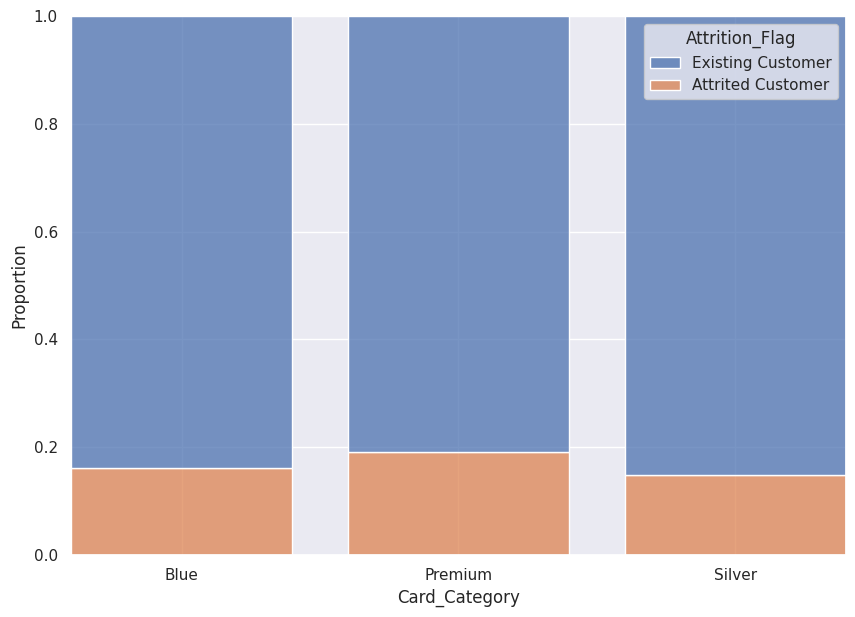

In [ ]:

sns.histplot(
    data=data,
    x="Card_Category", hue="Attrition_Flag",
    multiple="fill", stat="proportion",
    discrete=True, shrink=.8)

Customers owning a Silver or Blue card are less likely to attrit.

Customers with Platinum or Gold ( premium) cards are more likley to attrit.

In [ ]:
# plot correlation matrix: Heatmap

<ipython-input-68-090e6599ce82>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")


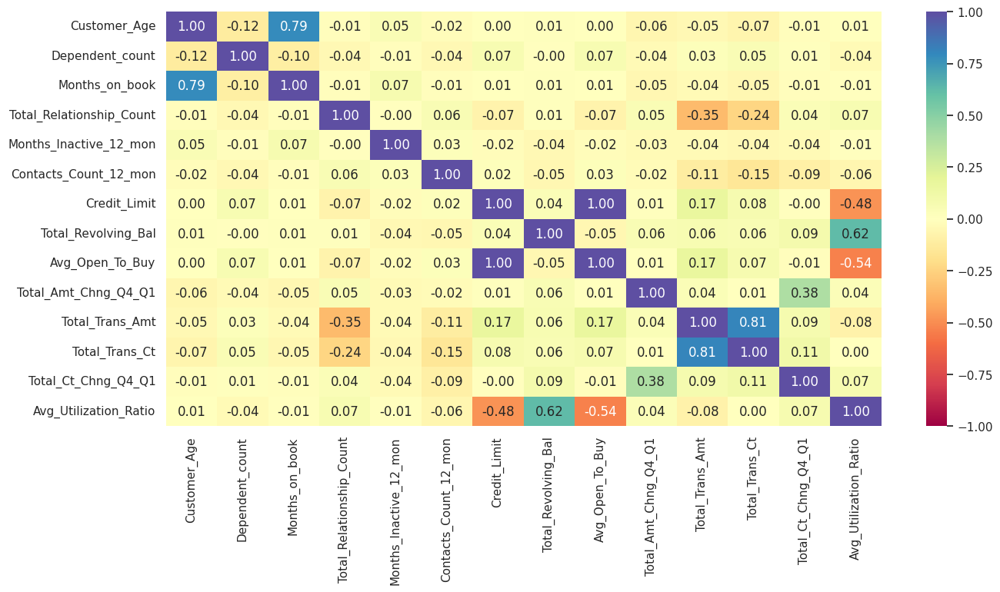

In [ ]:
# plot correlation matrix
plt.figure(figsize=(15, 7))
sns.heatmap(data.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")
plt.show()

Total_Trans_Ct is highly correlated with Total_Trans_Amt which makes sense since both are related to the transactions of the credit card holder.

Months_on_book is related to Customer_Age which makes some sense since older customers would have more time on the banks books.

Avg_Utilization_Ratio has a correlation with Total_Revolving_Bal which makes sense since both are related to blaance.

Other variables have no significant correlation between them.

#Data preprocessing for modelling:


In [ ]:
#Separating the target and independent variables:
# Separating target variable and other variables
X = data.drop(columns="Attrition_Flag")

# make dependent variable
y = data["Attrition_Flag"]

# check head
X.head()

,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,45.0,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,49.0,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,51.0,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,40.0,F,4,High School,Married,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,40.0,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [ ]:
y

0        Existing Customer
1        Existing Customer
2        Existing Customer
3        Existing Customer
4        Existing Customer
               ...        
10122    Existing Customer
10123    Attrited Customer
10124    Attrited Customer
10125    Attrited Customer
10126    Attrited Customer
Name: Attrition_Flag, Length: 10127, dtype: object

# Feature Scaling:
Let's create a group of columns/independent variables for which the feature scaling is designed...

In [ ]:
from sklearn.preprocessing import StandardScaler

In [ ]:
# Divide the DataFrame (X) into numeric and categorical columns
numeric_columns = X.select_dtypes(exclude=['object']).columns
numeric_columns


Index(['Customer_Age', 'Dependent_count', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio'],
      dtype='object')

In [ ]:
categorical_df = X.select_dtypes(include=['object'])
categorical_df

,Gender,Education_Level,Marital_Status,Income_Category,Card_Category
0,M,High School,Married,$60K - $80K,Blue
1,F,Graduate,Single,Less than $40K,Blue
2,M,Graduate,Married,$80K - $120K,Blue
3,F,High School,Married,Less than $40K,Blue
4,M,Uneducated,Married,$60K - $80K,Blue
...,...,...,...,...,...
10122,M,Graduate,Single,$40K - $60K,Blue
10123,M,High School,Divorced,$40K - $60K,Blue
10124,F,High School,Married,Less than $40K,Blue
10125,M,Graduate,Married,$40K - $60K,Blue


In [ ]:
# Apply feature scaling to numeric columns
scaler = StandardScaler()
X[numeric_columns] = scaler.fit_transform(X[numeric_columns])
X[numeric_columns]

,Customer_Age,Dependent_count,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,-0.165294,0.503368,0.384621,0.763943,-1.327136,0.492404,0.446622,-0.473422,0.488971,2.623494,-0.959707,-0.973895,3.834003,-0.775882
1,0.333843,2.043199,1.010715,1.407306,-1.327136,-0.411616,-0.041367,-0.366667,-0.008486,3.563293,-0.916433,-1.357340,12.608573,-0.616276
2,0.583412,0.503368,0.008965,0.120579,-1.327136,-2.219655,-0.573698,-1.426858,-0.445658,8.367214,-0.740982,-1.911206,6.807864,-0.997155
3,-0.789217,1.273283,-0.241473,-0.522785,1.641478,-1.315636,-0.585251,1.661686,-0.734100,2.942843,-0.951758,-1.911206,6.807864,1.759686
4,-0.789217,0.503368,-1.869317,0.763943,-1.327136,-2.219655,-0.430877,-1.426858,-0.302868,6.455682,-1.056263,-1.570365,7.509325,-0.997155
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,0.458628,-0.266547,0.509840,-0.522785,-0.337598,0.492404,-0.509330,0.844455,-0.584929,-0.259771,3.259358,2.221481,0.608119,0.678714
10123,-0.664432,-0.266547,-1.368442,0.120579,-0.337598,0.492404,-0.479181,1.255524,-0.591639,0.201004,1.283475,0.176440,-0.122745,0.856458
10124,-0.290079,-1.036462,0.008965,0.763943,0.651940,1.396424,-0.354626,-1.426858,-0.226632,0.269436,1.732994,-0.207005,0.444305,-0.997155
10125,-2.037061,-0.266547,0.008965,0.120579,0.651940,0.492404,-0.368710,-1.426858,-0.240713,-1.026208,1.174848,-0.121795,0.041070,-0.997155


In [ ]:
# set dummy variables: Similar to the One hot
cat_ohe = pd.get_dummies(
    categorical_df, categorical_df.columns,
    drop_first=True)
cat_ohe

,Gender_M,Education_Level_Doctorate,Education_Level_Graduate,Education_Level_High School,Education_Level_Post-Graduate,Education_Level_Uneducated,Marital_Status_Married,Marital_Status_Single,Income_Category_$40K - $60K,Income_Category_$60K - $80K,Income_Category_$80K - $120K,Income_Category_Less than $40K,Card_Category_Premium,Card_Category_Silver
0,1,0,0,1,0,0,1,0,0,1,0,0,0,0
1,0,0,1,0,0,0,0,1,0,0,0,1,0,0
2,1,0,1,0,0,0,1,0,0,0,1,0,0,0
3,0,0,0,1,0,0,1,0,0,0,0,1,0,0
4,1,0,0,0,0,1,1,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,1,0,1,0,0,0,0,1,1,0,0,0,0,0
10123,1,0,0,1,0,0,0,0,1,0,0,0,0,0
10124,0,0,0,1,0,0,1,0,0,0,0,1,0,0
10125,1,0,1,0,0,0,1,0,1,0,0,0,0,0


In [ ]:
X_processed = pd.concat([cat_ohe,data[numeric_columns]], axis =1)
X_processed

,Gender_M,Education_Level_Doctorate,Education_Level_Graduate,Education_Level_High School,Education_Level_Post-Graduate,Education_Level_Uneducated,Marital_Status_Married,Marital_Status_Single,Income_Category_$40K - $60K,Income_Category_$60K - $80K,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,1,0,0,1,0,0,1,0,0,1,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,0,0,1,0,0,0,0,1,0,0,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,1,0,1,0,0,0,1,0,0,0,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,0,0,0,1,0,0,1,0,0,0,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,1,0,0,0,0,1,1,0,0,1,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,1,0,1,0,0,0,0,1,1,0,...,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462
10123,1,0,0,1,0,0,0,0,1,0,...,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511
10124,0,0,0,1,0,0,1,0,0,0,...,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000
10125,1,0,1,0,0,0,1,0,1,0,...,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000


In [ ]:
X_processed.shape

(10127, 28)

# **5) Data Preprocessing for Modeling**

In [ ]:
y

0        Existing Customer
1        Existing Customer
2        Existing Customer
3        Existing Customer
4        Existing Customer
               ...        
10122    Existing Customer
10123    Attrited Customer
10124    Attrited Customer
10125    Attrited Customer
10126    Attrited Customer
Name: Attrition_Flag, Length: 10127, dtype: object

In [ ]:
type(y)
type(X)

In [ ]:
y_df = pd.DataFrame(y)
y_df

,Attrition_Flag
0,Existing Customer
1,Existing Customer
2,Existing Customer
3,Existing Customer
4,Existing Customer
...,...
10122,Existing Customer
10123,Attrited Customer
10124,Attrited Customer
10125,Attrited Customer


In [ ]:
y_df['Attrition_Flag'] = y_df['Attrition_Flag'].map({'Existing Customer':1, 'Attrited Customer':0})
y_df['Attrition_Flag']

0        1
1        1
2        1
3        1
4        1
        ..
10122    1
10123    0
10124    0
10125    0
10126    0
Name: Attrition_Flag, Length: 10127, dtype: int64

In [ ]:
# print percentage of each unique value in the Y series
y_df.value_counts()/ 100

Attrition_Flag
1                 85.00
0                 16.27
dtype: float64

#Splitting data into training, validation and test set:

In [155]:
from sklearn.model_selection import train_test_split
# first we split data into 2 parts, say temporary and test

X_temp, X_test, y_temp, y_test = train_test_split(
    X_processed, y_df, test_size=0.20, random_state=1, stratify=y_df
)

# then we split the temporary set into train and validation

X_train, X_val, y_train, y_val = train_test_split(
    X_temp,
    y_temp,
    test_size=0.25,
    random_state=2,
    stratify=y_temp  # set the weighting feature on
)
print(X_train.shape, X_val.shape, X_test.shape)

(6075, 28) (2026, 28) (2026, 28)


In [156]:
X_train

,Gender_M,Education_Level_Doctorate,Education_Level_Graduate,Education_Level_High School,Education_Level_Post-Graduate,Education_Level_Uneducated,Marital_Status_Married,Marital_Status_Single,Income_Category_$40K - $60K,Income_Category_$60K - $80K,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
9041,1,0,0,0,0,1,1,0,0,0,...,2,1,13356.0,1497,11859.0,0.753,8963,105,0.694,0.112
7200,1,0,0,0,0,0,1,0,0,0,...,3,3,2311.0,1222,1089.0,0.674,4730,89,0.745,0.529
8431,1,0,1,0,0,0,0,1,0,1,...,3,3,3460.0,0,3460.0,0.466,2355,47,0.621,0.000
3854,0,0,0,1,0,0,0,1,0,0,...,6,1,1686.0,1271,415.0,1.087,3445,64,0.730,0.754
6124,0,0,0,1,0,0,0,0,1,0,...,1,3,2405.0,1410,995.0,0.866,4421,79,0.881,0.586
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4115,0,0,1,0,0,0,0,1,0,0,...,1,3,4408.0,1201,3207.0,0.770,4157,71,0.651,0.272
2399,1,0,1,0,0,0,1,0,0,1,...,3,3,5323.0,2301,3022.0,0.680,1783,33,0.650,0.432
1706,1,0,0,0,0,0,0,1,1,0,...,1,3,9096.0,0,9096.0,0.768,2318,54,0.688,0.000
1647,1,0,0,1,0,0,1,0,0,1,...,1,2,11894.0,816,11078.0,1.561,2438,45,0.607,0.069


In [ ]:
X_processed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 28 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Gender_M                        10127 non-null  uint8  
 1   Education_Level_Doctorate       10127 non-null  uint8  
 2   Education_Level_Graduate        10127 non-null  uint8  
 3   Education_Level_High School     10127 non-null  uint8  
 4   Education_Level_Post-Graduate   10127 non-null  uint8  
 5   Education_Level_Uneducated      10127 non-null  uint8  
 6   Marital_Status_Married          10127 non-null  uint8  
 7   Marital_Status_Single           10127 non-null  uint8  
 8   Income_Category_$40K - $60K     10127 non-null  uint8  
 9   Income_Category_$60K - $80K     10127 non-null  uint8  
 10  Income_Category_$80K - $120K    10127 non-null  uint8  
 11  Income_Category_Less than $40K  10127 non-null  uint8  
 12  Card_Category_Premium           

In [159]:
X_processed

,Gender_M,Education_Level_Doctorate,Education_Level_Graduate,Education_Level_High School,Education_Level_Post-Graduate,Education_Level_Uneducated,Marital_Status_Married,Marital_Status_Single,Income_Category_$40K - $60K,Income_Category_$60K - $80K,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,1,0,0,1,0,0,1,0,0,1,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,0,0,1,0,0,0,0,1,0,0,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,1,0,1,0,0,0,1,0,0,0,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,0,0,0,1,0,0,1,0,0,0,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,1,0,0,0,0,1,1,0,0,1,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10122,1,0,1,0,0,0,0,1,1,0,...,2,3,4003.0,1851,2152.0,0.703,15476,117,0.857,0.462
10123,1,0,0,1,0,0,0,0,1,0,...,2,3,4277.0,2186,2091.0,0.804,8764,69,0.683,0.511
10124,0,0,0,1,0,0,1,0,0,0,...,3,4,5409.0,0,5409.0,0.819,10291,60,0.818,0.000
10125,1,0,1,0,0,0,1,0,1,0,...,3,3,5281.0,0,5281.0,0.535,8395,62,0.722,0.000


In [160]:
y_df

,Attrition_Flag
0,1
1,1
2,1
3,1
4,1
...,...
10122,1
10123,0
10124,0
10125,0


#Checking Missing-Values

In [ ]:
# show missing values
X.isna().sum()

Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

In [ ]:
# check for missingness in training set
np.nan in X_train

False

In [ ]:
np.nan in y_df

False

In [ ]:
# get column count
len(X_train.T)

28

In [ ]:
X_train

,Gender_M,Education_Level_Doctorate,Education_Level_Graduate,Education_Level_High School,Education_Level_Post-Graduate,Education_Level_Uneducated,Marital_Status_Married,Marital_Status_Single,Income_Category_$40K - $60K,Income_Category_$60K - $80K,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
9041,1,0,0,0,0,1,1,0,0,0,...,2,1,13356.0,1497,11859.0,0.753,8963,105,0.694,0.112
7200,1,0,0,0,0,0,1,0,0,0,...,3,3,2311.0,1222,1089.0,0.674,4730,89,0.745,0.529
8431,1,0,1,0,0,0,0,1,0,1,...,3,3,3460.0,0,3460.0,0.466,2355,47,0.621,0.000
3854,0,0,0,1,0,0,0,1,0,0,...,6,1,1686.0,1271,415.0,1.087,3445,64,0.730,0.754
6124,0,0,0,1,0,0,0,0,1,0,...,1,3,2405.0,1410,995.0,0.866,4421,79,0.881,0.586
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4115,0,0,1,0,0,0,0,1,0,0,...,1,3,4408.0,1201,3207.0,0.770,4157,71,0.651,0.272
2399,1,0,1,0,0,0,1,0,0,1,...,3,3,5323.0,2301,3022.0,0.680,1783,33,0.650,0.432
1706,1,0,0,0,0,0,0,1,1,0,...,1,3,9096.0,0,9096.0,0.768,2318,54,0.688,0.000
1647,1,0,0,1,0,0,1,0,0,1,...,1,2,11894.0,816,11078.0,1.561,2438,45,0.607,0.069


In [ ]:
y_train

,Attrition_Flag
9041,1
7200,1
8431,0
3854,1
6124,1
...,...
4115,1
2399,1
1706,1
1647,1


# **6) MODEL BUILDING:**
The model building is the easiest process in data science.There are lots of classification algorithm to go with.However, there is no certainity that this mdel or that model will perform better.Hence, we have to try different models and see which model performs better.

In [ ]:
import warnings
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math




from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import (
    AdaBoostClassifier,
    GradientBoostingClassifier,
    BaggingClassifier,
)
from xgboost import XGBClassifier

from sklearn.tree import DecisionTreeClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier

from sklearn import metrics
# To get different metric scores, and split data
from sklearn import metrics
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.metrics import (
    f1_score,
    accuracy_score,
    recall_score,
    precision_score,
    confusion_matrix,
    roc_auc_score,
)


from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split



from sklearn.preprocessing import StandardScaler

# Building and Training Models:

In [ ]:
# Define classifiers
algorithms = [
    ("LR", LogisticRegression(random_state=1, class_weight={0: 16, 1: 84}, solver='lbfgs', max_iter=1000)),
    ("DT", DecisionTreeClassifier(random_state=1, class_weight={0: 16, 1: 84})),
    ("GBC", GradientBoostingClassifier(random_state=1)),
    ("Adaboost", AdaBoostClassifier(random_state=1)),
    ("Xgboost", XGBClassifier(random_state=1, eval_metric="logloss")),
    ("Bagging", BaggingClassifier(random_state=1))
]

# Initialize lists to store results
results = []
metrics = ['Accuracy', 'Recall', 'Precision', 'F1 Score']
evaluation_df = pd.DataFrame(columns=['Model', 'Cross_Val_Score_Train', 'Train_Accuracy', 'Test_Accuracy',
                                      'Train_Recall', 'Test_Recall', 'Train_Precision', 'Test_Precision',
                                      'Train_F1', 'Test_F1', 'Train_ROC_AUC', 'Test_ROC_AUC'])

# Loop through classifiers
cv_dict = {}
for name, model in algorithms:
    # Cross-validation
    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)
    cv_result = cross_val_score(model, X_train, y_train.values.ravel(), scoring='recall', cv=kfold) # array
    cv_dict[name] = cv_result # dictionary of model_name and CV_SCORE
    cv_df = pd.DataFrame(cv_dict) # For boxplot drawing

    mean_recall = cv_result.mean()

    # Fit model
    model.fit(X_train, y_train.values.ravel())

    # Predict
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    # Calculate evaluation metrics
    train_accuracy = accuracy_score(y_train.values.ravel(), y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    train_recall = recall_score(y_train.values.ravel(), y_train_pred)
    test_recall = recall_score(y_test, y_test_pred)
    train_precision = precision_score(y_train.values.ravel(), y_train_pred)
    test_precision = precision_score(y_test, y_test_pred)
    train_f1 = f1_score(y_train.values.ravel(), y_train_pred)
    test_f1 = f1_score(y_test, y_test_pred)
    train_roc_auc = roc_auc_score(y_train.values.ravel(), y_train_pred)
    test_roc_auc = roc_auc_score(y_test, y_test_pred)

    # Store results
    results.append((name, mean_recall, train_accuracy, test_accuracy, train_recall, test_recall, train_precision,
                    test_precision, train_f1, test_f1, train_roc_auc, test_roc_auc))

# Create DataFrame from results
evaluation_df = pd.DataFrame(results, columns=['Model', 'Cross_Val_Score_Train', 'Train_Accuracy', 'Test_Accuracy',
                                               'Train_Recall', 'Test_Recall', 'Train_Precision', 'Test_Precision',
                                               'Train_F1', 'Test_F1', 'Train_ROC_AUC', 'Test_ROC_AUC'])

import numpy as np

# Highlighting maximum value in green and minimum value in red
def highlight_max_min(s):
    is_max = s == s.max()
    is_min = s == s.min()
    styles = np.where(is_max, 'background-color: green', np.where(is_min, 'background-color: red', ''))
    return styles

# Apply conditional formatting without considering the index
evaluation_df_style = evaluation_df.style.apply(highlight_max_min, subset=['Cross_Val_Score_Train', 'Train_Accuracy',
                                                                          'Test_Accuracy', 'Train_Recall', 'Test_Recall',
                                                                          'Train_Precision', 'Test_Precision', 'Train_F1',
                                                                          'Test_F1', 'Train_ROC_AUC', 'Test_ROC_AUC'], axis=None)

# Display styled DataFrame
evaluation_df_style

,Model,Cross_Val_Score_Train,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1,Train_ROC_AUC,Test_ROC_AUC
0,LR,0.994705,0.871440,0.874630,0.996470,0.998824,0.869439,0.870835,0.928630,0.930449,0.607354,0.611720
1,DT,0.955481,1.000000,0.938796,1.000000,0.967666,1.000000,0.959767,1.000000,0.963700,1.000000,0.877679
2,GBC,0.989213,0.978930,0.965449,0.994116,0.991182,0.981033,0.968409,0.987532,0.979663,0.946853,0.910975
3,Adaboost,0.979407,0.965761,0.953603,0.984311,0.977072,0.975131,0.967967,0.979699,0.972499,0.926582,0.903921
4,Xgboost,0.986664,1.000000,0.967423,1.000000,0.987066,1.000000,0.974463,1.000000,0.980724,1.000000,0.925841
5,Bagging,0.970582,0.999012,0.955084,0.999608,0.975897,0.999216,0.970760,0.999412,0.973322,0.997755,0.911025


In [ ]:
gbc_cv = evaluation_df.Cross_Val_Score_Train[2] # derived from the original LR model

The best model with respect to cross validation score and test recall is  Logistic Regression

The next best models are GBC and XgBoost respectively.

This anlysis is based on the fact that the false positive gets less priority and false negative gets the more priority.

False positive: In the context of customer churn prediction, a false positive refers to a situation where the model predicts that a customer will churn (i.e., leave or discontinue using the service) when, in reality, the customer does not actually churn.

False Negative: In the context of customer churn prediction, a false negative occurs when the model predicts that a customer will not churn (i.e., stay with the service) when, in reality, the customer does churn.

# Comparing the algorithms based on the recall:



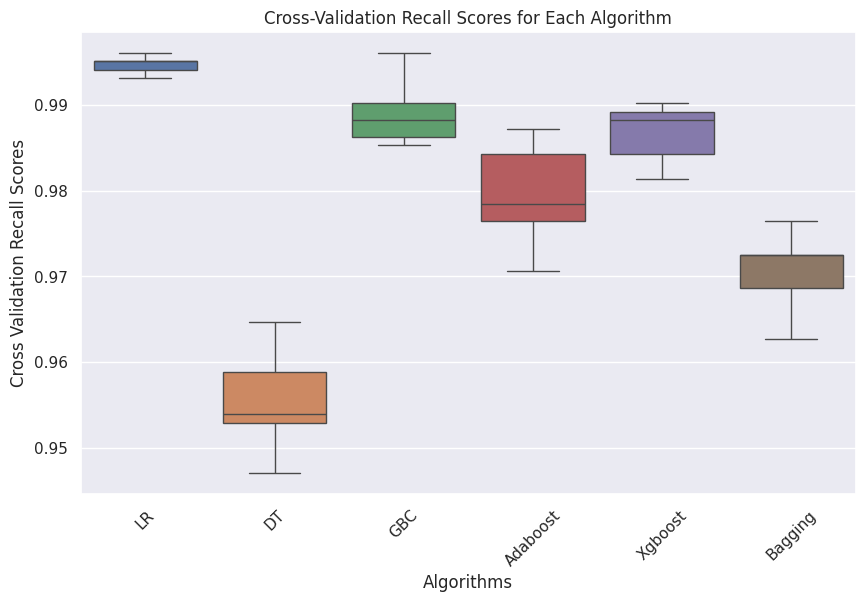

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
# Plotting box plots
plt.figure(figsize=(10, 6))
sns.boxplot(data=cv_df)
plt.title('Cross-Validation Recall Scores for Each Algorithm')
plt.xlabel('Algorithms')
plt.ylabel('Cross Validation Recall Scores')
plt.xticks(rotation=45)
plt.show()

It is found that logistic regression performs well followed by the GBC nad the Xgboost based on the cross validation recall score.

# **SMOTE (Synthetic Minority Oversampling Technique) to fix the Imbalance dataset:** Oversampling train data using SMOTE...



In [ ]:
# resample by adding samples to minority class using SMOTE
from imblearn.combine import SMOTETomek
from imblearn.under_sampling import TomekLinks

# Suppress ConvergenceWarning
warnings.filterwarnings("ignore", category=FutureWarning)
# Reset warnings filter
warnings.filterwarnings("default", category=FutureWarning)

In [ ]:
from imblearn.over_sampling import SMOTE

# Print class distribution before oversampling
print("Before UpSampling, counts of label 'Yes': {}".format(sum(y_train.values.ravel() == 1)))
print("Before UpSampling, counts of label 'No': {} \n".format(sum(y_train.values.ravel() == 0)))

# SMOTE (Synthetic Minority Over Sampling Technique)
sm = SMOTE(sampling_strategy="minority", k_neighbors=10, random_state=1)
X_train_over, y_train_over = sm.fit_resample(X_train, y_train.values.ravel())

# Print class distribution after oversampling
print("After UpSampling, counts of label 'Yes': {}".format(sum(y_train_over == 1)))
print("After UpSampling, counts of label 'No': {} \n".format(sum(y_train_over == 0)))

# Print shape of the oversampled dataset
print("After UpSampling, the shape of train_X: {}".format(X_train_over.shape))
print("After UpSampling, the shape of train_y: {} \n".format(y_train_over.shape))

Before UpSampling, counts of label 'Yes': 5099
Before UpSampling, counts of label 'No': 976 

After UpSampling, counts of label 'Yes': 5099
After UpSampling, counts of label 'No': 5099 

After UpSampling, the shape of train_X: (10198, 28)
After UpSampling, the shape of train_y: (10198,) 



# **Build Models with Oversampled Data From the SMOTE Technique:**

Again, all six algorithms are built and trained employing the over-sampled training data for training the models.

In [ ]:
# Define classifiers
algorithms = [
    ("LR_over", LogisticRegression(random_state=0, class_weight={0: 16, 1: 84}, solver= 'liblinear', max_iter=1000)),
    ("DT_over", DecisionTreeClassifier(random_state=0, class_weight={0: 16, 1: 84})),
    ("GBC_over", GradientBoostingClassifier(random_state=0)),
    ("Adaboost_over", AdaBoostClassifier(random_state=0)),
    ("Xgboost_over", XGBClassifier(random_state=0, eval_metric="logloss")),
    ("Bagging_over", BaggingClassifier(random_state=0))
]

# Initialize lists to store results
results = []
metrics = ['Accuracy', 'Recall', 'Precision', 'F1 Score']
evaluation_df = pd.DataFrame(columns=['Model', 'Cross_Val_Score_Train', 'Train_Accuracy', 'Test_Accuracy',
                                      'Train_Recall', 'Test_Recall', 'Train_Precision', 'Test_Precision',
                                      'Train_F1', 'Test_F1', 'Train_ROC_AUC', 'Test_ROC_AUC'])

# Loop through classifiers
cv_dict={}
for name, model in algorithms:
    # Cross-validation
    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)
    cv_result = cross_val_score(model, X_train_over, y_train_over, scoring='recall', cv=kfold)
    cv_dict[name]=cv_result# dict of model_name:cv_result
    cv_df=pd.DataFrame(cv_dict)
    mean_recall = cv_result.mean()

    # Fit model
    model.fit(X_train_over, y_train_over)

    # Predict
    y_train_pred = model.predict(X_train_over)
    y_test_pred = model.predict(X_test)

    # Calculate evaluation metrics
    train_accuracy = accuracy_score(y_train_over, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    train_recall = recall_score(y_train_over, y_train_pred)
    test_recall = recall_score(y_test, y_test_pred)
    train_precision = precision_score(y_train_over, y_train_pred)
    test_precision = precision_score(y_test, y_test_pred)
    train_f1 = f1_score(y_train_over, y_train_pred)
    test_f1 = f1_score(y_test, y_test_pred)
    train_roc_auc = roc_auc_score(y_train_over, y_train_pred)
    test_roc_auc = roc_auc_score(y_test, y_test_pred)

    # Store results
    results.append((name, mean_recall, train_accuracy, test_accuracy, train_recall, test_recall, train_precision,
                    test_precision, train_f1, test_f1, train_roc_auc, test_roc_auc))

# Create DataFrame from results
evaluation_df_over = pd.DataFrame(results, columns=['Model', 'Cross_Val_Score_Train', 'Train_Accuracy', 'Test_Accuracy',
                                               'Train_Recall', 'Test_Recall', 'Train_Precision', 'Test_Precision',
                                               'Train_F1', 'Test_F1', 'Train_ROC_AUC', 'Test_ROC_AUC'])

import numpy as np

# Highlighting maximum value in green and minimum value in red
def highlight_max_min(s):
    is_max = s == s.max()
    is_min = s == s.min()
    styles = np.where(is_max, 'background-color: green', np.where(is_min, 'background-color: red', ''))
    return styles

# Apply conditional formatting without considering the index
evaluation_df_style_over = evaluation_df_over.style.apply(highlight_max_min, subset=['Cross_Val_Score_Train', 'Train_Accuracy',
                                                                          'Test_Accuracy', 'Train_Recall', 'Test_Recall',
                                                                          'Train_Precision', 'Test_Precision', 'Train_F1',
                                                                          'Test_F1', 'Train_ROC_AUC', 'Test_ROC_AUC'], axis=None)

# Display styled DataFrame
evaluation_df_style_over

,Model,Cross_Val_Score_Train,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1,Train_ROC_AUC,Test_ROC_AUC
0,LR_over,0.975093,0.752893,0.890918,0.974701,0.980600,0.675180,0.898707,0.797753,0.937869,0.752893,0.701069
1,DT_over,0.936262,1.000000,0.930898,1.000000,0.949442,1.000000,0.967645,1.000000,0.958457,1.000000,0.891644
2,GBC_over,0.970385,0.979212,0.957552,0.976270,0.970018,0.982048,0.979228,0.979150,0.974601,0.979212,0.931163
3,Adaboost_over,0.955089,0.966562,0.944719,0.963326,0.956496,0.969601,0.977177,0.966454,0.966726,0.966562,0.919787
4,Xgboost_over,0.979212,1.000000,0.964462,1.000000,0.979424,1.000000,0.978274,1.000000,0.978848,1.000000,0.932789
5,Bagging_over,0.946461,0.997254,0.941757,0.995882,0.955320,0.998623,0.974805,0.997251,0.964964,0.997254,0.913045


In [133]:
lr_cv_over = evaluation_df_over.Cross_Val_Score_Train[0]
lr_cv_over

0.9750928438107334

# **Comparing the original model with the oversampled model:**

In [ ]:
# Concatenate the styled representations
df_compare = pd.concat([evaluation_df_style_over.data, evaluation_df_style.data], axis=0)

# Set a custom index
df_compare.index = ['Evaluation_df_Over'] * len(evaluation_df_style_over.data) + ['Evaluation_df'] * len(evaluation_df_style.data)

# Reset the index to make it unique
df_compare_reset_index = df_compare.reset_index(drop=True)

# Sort the DataFrame by index
df_compare_sorted = df_compare_reset_index.sort_index()

# Sort the DataFrame by 'Cross_Val_Score_Train' and 'Test_Recall'
df_compare_sorted = df_compare_sorted.sort_values(by=['Cross_Val_Score_Train', 'Test_Recall'], ascending=False)

# Apply conditional formatting
styled_df_compare = df_compare_sorted.style.apply(highlight_max_min, subset=['Cross_Val_Score_Train', 'Train_Accuracy',
                                                                              'Test_Accuracy', 'Train_Recall', 'Test_Recall',
                                                                              'Train_Precision', 'Test_Precision', 'Train_F1',
                                                                              'Test_F1', 'Train_ROC_AUC', 'Test_ROC_AUC'], axis=None)
# Display the sorted DataFrame
styled_df_compare

,Model,Cross_Val_Score_Train,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1,Train_ROC_AUC,Test_ROC_AUC
6,LR,0.994705,0.871440,0.874630,0.996470,0.998824,0.869439,0.870835,0.928630,0.930449,0.607354,0.611720
8,GBC,0.989213,0.978930,0.965449,0.994116,0.991182,0.981033,0.968409,0.987532,0.979663,0.946853,0.910975
10,Xgboost,0.986664,1.000000,0.967423,1.000000,0.987066,1.000000,0.974463,1.000000,0.980724,1.000000,0.925841
9,Adaboost,0.979407,0.965761,0.953603,0.984311,0.977072,0.975131,0.967967,0.979699,0.972499,0.926582,0.903921
4,Xgboost_over,0.979212,1.000000,0.964462,1.000000,0.979424,1.000000,0.978274,1.000000,0.978848,1.000000,0.932789
0,LR_over,0.975093,0.752893,0.890918,0.974701,0.980600,0.675180,0.898707,0.797753,0.937869,0.752893,0.701069
11,Bagging,0.970582,0.999012,0.955084,0.999608,0.975897,0.999216,0.970760,0.999412,0.973322,0.997755,0.911025
2,GBC_over,0.970385,0.979212,0.957552,0.976270,0.970018,0.982048,0.979228,0.979150,0.974601,0.979212,0.931163
7,DT,0.955481,1.000000,0.938796,1.000000,0.967666,1.000000,0.959767,1.000000,0.963700,1.000000,0.877679
3,Adaboost_over,0.955089,0.966562,0.944719,0.963326,0.956496,0.969601,0.977177,0.966454,0.966726,0.966562,0.919787


It is found that logistic regression performs well again followed by the GBC nad the Xgboost based on the cross validation recall score.




# **Undersampling the train data employing the Random Under Sampler Technique**

Undersampling serves as an alternative approach to addressing dataset imbalance.

In random undersampling, instances from the majority class are randomly chosen and removed from the training dataset until achieving balance.

In [ ]:
from imblearn.under_sampling import RandomUnderSampler

In [ ]:
rus = RandomUnderSampler(random_state=2)
X_train_under, y_train_under = rus.fit_resample(X_train, y_train.values.ravel())

In [ ]:
print("Before Under Sampling, counts of label 'Yes': {}".format(sum(y_train.values.ravel() == 1)))
print("Before Under Sampling, counts of label 'No': {} \n".format(sum(y_train.values.ravel() == 0)))

print("After Under Sampling, counts of label 'Yes': {}".format(sum(y_train_under == 1)))
print("After Under Sampling, counts of label 'No': {} \n".format(sum(y_train_under == 0)))

print("After Under Sampling, the shape of train_X: {}".format(X_train_under.shape))
print("After Under Sampling, the shape of train_y: {} \n".format(y_train_under.shape))

Before Under Sampling, counts of label 'Yes': 5099
Before Under Sampling, counts of label 'No': 976 

After Under Sampling, counts of label 'Yes': 976
After Under Sampling, counts of label 'No': 976 

After Under Sampling, the shape of train_X: (1952, 28)
After Under Sampling, the shape of train_y: (1952,) 



# **Building and training the model with undersampled data:**

In [ ]:
# Define classifiers
algorithms = [
    ("LR_under", LogisticRegression(random_state=0, class_weight={0: 16, 1: 84}, solver= 'liblinear', max_iter=1000)),
    ("DT_under", DecisionTreeClassifier(random_state=0, class_weight={0: 16, 1: 84})),
    ("GBC_under", GradientBoostingClassifier(random_state=0)),
    ("Adaboost_under", AdaBoostClassifier(random_state=0)),
    ("Xgboost_under", XGBClassifier(random_state=0, eval_metric="logloss")),
    ("Bagging_under", BaggingClassifier(random_state=0))
]

# Initialize lists to store results
results = []
metrics = ['Accuracy', 'Recall', 'Precision', 'F1 Score']
evaluation_df = pd.DataFrame(columns=['Model', 'Cross_Val_Score_Train', 'Train_Accuracy', 'Test_Accuracy',
                                      'Train_Recall', 'Test_Recall', 'Train_Precision', 'Test_Precision',
                                      'Train_F1', 'Test_F1', 'Train_ROC_AUC', 'Test_ROC_AUC'])

# Loop through classifiers
cv_dict={}
for name, model in algorithms:
    # Cross-validation
    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)
    cv_result = cross_val_score(model, X_train_under, y_train_under, scoring='recall', cv=kfold)
    cv_dict[name]=cv_result# dict of model_name:cv_result
    cv_df=pd.DataFrame(cv_dict)
    mean_recall = cv_result.mean()

    # Fit model
    model.fit(X_train_under, y_train_under)

    # Predict
    y_train_pred = model.predict(X_train_under)
    y_test_pred = model.predict(X_test)

    # Calculate evaluation metrics
    train_accuracy = accuracy_score(y_train_under, y_train_pred)
    test_accuracy = accuracy_score(y_test, y_test_pred)
    train_recall = recall_score(y_train_under, y_train_pred)
    test_recall = recall_score(y_test, y_test_pred)
    train_precision = precision_score(y_train_under, y_train_pred)
    test_precision = precision_score(y_test, y_test_pred)
    train_f1 = f1_score(y_train_under, y_train_pred)
    test_f1 = f1_score(y_test, y_test_pred)
    train_roc_auc = roc_auc_score(y_train_under, y_train_pred)
    test_roc_auc = roc_auc_score(y_test, y_test_pred)

    # Store results
    results.append((name, mean_recall, train_accuracy, test_accuracy, train_recall, test_recall, train_precision,
                    test_precision, train_f1, test_f1, train_roc_auc, test_roc_auc))

# Create DataFrame from results
evaluation_df_under = pd.DataFrame(results, columns=['Model', 'Cross_Val_Score_Train', 'Train_Accuracy', 'Test_Accuracy',
                                               'Train_Recall', 'Test_Recall', 'Train_Precision', 'Test_Precision',
                                               'Train_F1', 'Test_F1', 'Train_ROC_AUC', 'Test_ROC_AUC'])

import numpy as np

# Highlighting maximum value in green and minimum value in red
def highlight_max_min(s):
    is_max = s == s.max()
    is_min = s == s.min()
    styles = np.where(is_max, 'background-color: green', np.where(is_min, 'background-color: red', ''))
    return styles

# Apply conditional formatting without considering the index
evaluation_df_style_under = evaluation_df_under.style.apply(highlight_max_min, subset=['Cross_Val_Score_Train', 'Train_Accuracy',
                                                                          'Test_Accuracy', 'Train_Recall', 'Test_Recall',
                                                                          'Train_Precision', 'Test_Precision', 'Train_F1',
                                                                          'Test_F1', 'Train_ROC_AUC', 'Test_ROC_AUC'], axis=None)

# Display styled DataFrame
evaluation_df_style_under

,Model,Cross_Val_Score_Train,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1,Train_ROC_AUC,Test_ROC_AUC
0,LR_under,0.967206,0.738217,0.888450,0.972336,0.968842,0.662247,0.904997,0.787879,0.935832,0.738217,0.718267
1,DT_under,0.865772,1.000000,0.889437,1.000000,0.893004,1.000000,0.973094,1.000000,0.931330,1.000000,0.881887
2,GBC_under,0.925191,0.974385,0.942251,0.969262,0.942975,0.979296,0.987685,0.974253,0.964812,0.974385,0.940718
3,Adaboost_under,0.914929,0.948258,0.932873,0.943648,0.931217,0.952430,0.988147,0.948019,0.958838,0.948258,0.936378
4,Xgboost_under,0.933386,1.000000,0.944225,1.000000,0.947678,1.000000,0.985330,1.000000,0.966137,1.000000,0.936916
5,Bagging_under,0.892423,0.993340,0.919052,0.989754,0.917695,0.996904,0.984858,0.993316,0.950091,0.993340,0.921925


The logistic regression performs well followed by the Xgboost and GBC based on the undersampling dataset.

# **Comparing the Performance of the original model with the oversampled and undersampled model:**

In [ ]:
# Concatenate the styled representations
df_compare = pd.concat([evaluation_df_style_over.data, evaluation_df_style_under.data, evaluation_df_style.data], axis=0)

# Set a custom index
df_compare.index = ['Evaluation_df_Over'] * len(evaluation_df_style_over.data)+['Evaluation_df_Under'] * len(evaluation_df_style_under.data)  + ['Evaluation_df'] * len(evaluation_df_style.data)

# Reset the index to make it unique
df_compare_reset_index = df_compare.reset_index(drop=True)

# Sort the DataFrame by index
df_compare_sorted = df_compare_reset_index.sort_index()

# Sort the DataFrame by 'Cross_Val_Score_Train' and 'Test_Recall'
df_compare_sorted = df_compare_sorted.sort_values(by=['Test_Recall', 'Cross_Val_Score_Train',], ascending=False)

# Apply conditional formatting
styled_df_compare = df_compare_sorted.style.apply(highlight_max_min, subset=['Cross_Val_Score_Train', 'Train_Accuracy',
                                                                              'Test_Accuracy', 'Train_Recall', 'Test_Recall',
                                                                              'Train_Precision', 'Test_Precision', 'Train_F1',
                                                                              'Test_F1', 'Train_ROC_AUC', 'Test_ROC_AUC'], axis=None)
# Display the sorted DataFrame
styled_df_compare

,Model,Cross_Val_Score_Train,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1,Train_ROC_AUC,Test_ROC_AUC
12,LR,0.994705,0.871440,0.874630,0.996470,0.998824,0.869439,0.870835,0.928630,0.930449,0.607354,0.611720
14,GBC,0.989213,0.978930,0.965449,0.994116,0.991182,0.981033,0.968409,0.987532,0.979663,0.946853,0.910975
16,Xgboost,0.986664,1.000000,0.967423,1.000000,0.987066,1.000000,0.974463,1.000000,0.980724,1.000000,0.925841
0,LR_over,0.975093,0.752893,0.890918,0.974701,0.980600,0.675180,0.898707,0.797753,0.937869,0.752893,0.701069
4,Xgboost_over,0.979212,1.000000,0.964462,1.000000,0.979424,1.000000,0.978274,1.000000,0.978848,1.000000,0.932789
15,Adaboost,0.979407,0.965761,0.953603,0.984311,0.977072,0.975131,0.967967,0.979699,0.972499,0.926582,0.903921
17,Bagging,0.970582,0.999012,0.955084,0.999608,0.975897,0.999216,0.970760,0.999412,0.973322,0.997755,0.911025
2,GBC_over,0.970385,0.979212,0.957552,0.976270,0.970018,0.982048,0.979228,0.979150,0.974601,0.979212,0.931163
6,LR_under,0.967206,0.738217,0.888450,0.972336,0.968842,0.662247,0.904997,0.787879,0.935832,0.738217,0.718267
13,DT,0.955481,1.000000,0.938796,1.000000,0.967666,1.000000,0.959767,1.000000,0.963700,1.000000,0.877679


Based on the above results, following are the four best models:

 a) Logistic regression with the original dataset,

 b) Gradient Boosting Classifier with the original dataset,

 c) Xgboost Classifier with the original dataset,

 d) Logistic regression with the oversampled dataset.

 Now, above-mentioned 4 models will be tuned employing the Random Search CV.

# How to choose the model for hyperparameter tuning?

Comparing the "Cross_Val_Score_Train" and the "Test_Recall",

a) Cross_Val_Score_Train of Logistic regression < Test_Recall of of Logistic regression, there is a bit sign of overfitting. Hence, the Logistic regression model is chosen for the hyperparameter tuning.

b) Cross_Val_Score_Train of Gradient Boosting < Test_Recall of of Gradient Boosting Classifier, there is a bit sign of overfitting. Hence, the Gradient Boosting Classifier model is chosen for the hyperparameter tuning.

c) Cross_Val_Score_Train of Xgboost Classifier < Test_Recall of  Xgboost Classifier, there is a bit sign of overfitting. Hence, the Xgboost Classifier model is chosen for the hyperparameter tuning.

d) Cross_Val_Score_Train of Logistic regression with the oversampled data model < Test_Recall of  Logistic regression with the oversampled data model, there is a bit sign of overfitting. Hence, the Xgboost Classifier model is chosen for the hyperparameter tuning.

# **Hyperparameter Tuning:**

The process of searching the optimal values of hyperparameters for any machine learning algorithm is called hyperparameter tuning/optimization.

The goal of Hyperparameter Tuning is to achieve a minimum error from the outcome of any ML models.

The Hyperparameter Tuning influences the convergence of any ML Algorithm to a large extent.

There are different types of Hyperparameter Tuning Methods:

1. GridSearch--slow method

2. RandomSearch--faster method

3. Successive Halving

4. Bayesian Optimizers

5. Manual Search

Here, I will conduct the RandomSearch cross-validation techique to tune the parameters of the ML models.



# **Model Tuning using RandomizedSearchCV**

**Tuning Logistic regression with the original dataset:**

Here, I will find the best parameter for high recall using Random Search with cross validation.

# **Getting the best parameters for tuning the model:**

In [ ]:
%%time

#To supress warnings
import warnings
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

# defining model
model = LogisticRegression(random_state=1, class_weight={0: 16, 1: 84}, solver='lbfgs', max_iter=1000)

# Parameter grid to pass in RandomizedSearchCV
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],  # Regularization parameter
    'class_weight': [{0: 16, 1: 84}, {0: 1, 1: 1}, {0: 1, 1: 5}],  # Class weight
    'solver': ['lbfgs', 'liblinear']  # Solver algorithm
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Calling RandomizedSearchCV
LR_tuned = RandomizedSearchCV(estimator=model, param_distributions=param_grid, n_iter=36, scoring=scorer, cv=10, random_state=42, n_jobs=-1)

# Fitting parameters in RandomizedSearchCV
LR_tuned.fit(X_train, y_train.values.ravel())

print("Best parameters are {} with CV score={}".format(LR_tuned.best_params_, LR_tuned.best_score_))


# Description about the parameters of the RandomizedSearchCV:

# estimator: This parameter specifies the model or estimator for which hyperparameters will be tuned. In this case, it's denoted as model, indicating the machine learning algorithm being tuned.

# param_distributions: This parameter is a dictionary where keys are the hyperparameters of the model, and values are lists or distributions of possible values for each hyperparameter. The RandomizedSearchCV will randomly sample from these distributions during the search for optimal hyperparameters.

# n_iter: This parameter specifies the number of parameter settings that are sampled. In this case, it's set to 36, meaning that 36 different combinations of hyperparameters will be tried during the search.

# scoring: This parameter defines the metric used to evaluate the performance of the model with different hyperparameters. It can be a single string metric identifier or a callable object that returns a score. In this case, scorer is used, which likely refers to a predefined scoring metric, such as accuracy, precision, recall, or F1-score.

# cv: This parameter determines the cross-validation splitting strategy. It can take an integer value to specify the number of folds in a K-fold cross-validation or a cross-validation splitter object. Here, cv=10 indicates that 10-fold cross-validation will be used during the hyperparameter search.

# random_state: This parameter is used to set the random seed for reproducibility. It ensures that the random sampling of hyperparameters is consistent across different runs of the search.

# n_jobs: This parameter specifies the number of parallel jobs to run during the hyperparameter search. Setting it to -1 indicates that all available CPU cores will be used for parallel processing.

Best parameters are {'solver': 'liblinear', 'class_weight': {0: 16, 1: 84}, 'C': 0.001} with CV score=0.9986274509803922
CPU times: user 1.17 s, sys: 199 ms, total: 1.37 s
Wall time: 38.3 s


# Tuning the first best model (LR with original dataset):
**Building the LR model with the  tuned/best parameters from the RandomizedSearchCV Techniques:**

In [ ]:
# Importing necessary libraries
from sklearn.linear_model import LogisticRegression

# Defining the best parameters obtained from hyperparameter tuning
best_params = {
    'solver': 'liblinear',
    'class_weight': {0: 16, 1: 84},
    'C': 0.001
}
#Smaller values of C specify stronger regularization. It is a technique used to prevent overfitting by adding a penalty term to the loss function.

# Building Logistic Regression model with best parameters
lr_tuned_model = LogisticRegression(**best_params, max_iter=1000, random_state=1)

# Fitting the model on training data
lr_tuned_model.fit(X_train, y_train.values.ravel())

LogisticRegression(C=0.001, class_weight={0: 16, 1: 84}, max_iter=1000,
                   random_state=1, solver='liblinear')

# Getting CV Score:

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.metrics import recall_score

# Create and train the Logistic Regression model
lr_tuned_model = LogisticRegression(C=0.001, class_weight={0: 16, 1: 84}, max_iter=1000, random_state=1, solver='liblinear')
lr_tuned_model.fit(X_train, y_train.values.ravel())

# Get evaluation metrics scores
recall_lr_train = recall_score(y_train, lr_tuned_model.predict(X_train))
recall_lr_val = recall_score(y_val, lr_tuned_model.predict(X_val))

# Perform cross-validation with StratifiedKFold
kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)
scoring = "recall"
lr_cv = cross_val_score(estimator=lr_tuned_model, X=X_train, y=y_train.values.ravel(), scoring=scoring, cv=kfold)

# Print evaluation metrics scores
print("Logistic Regression Tuned with original data:")
print(f"Train Recall: {recall_lr_train:.4f}")
print(f"Validation Recall: {recall_lr_val:.4f}")
print(f"Cross-Validation Mean Recall: {lr_cv.mean():.4f}")

Logistic Regression Tuned with original data:
Train Recall: 0.9996
Validation Recall: 1.0000
Cross-Validation Mean Recall: 0.9988


# **Getting Confusion matrix on validation dataset:**

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn import metrics

def make_confusion_matrix(model, test_X, y_actual, labels=[1, 0]):
    """
    model : classifier to predict values of X
    test_X: test set
    y_actual : ground truth
    """
    # Predict labels using the model
    y_predict = model.predict(test_X)

    # Compute confusion matrix
    cm = metrics.confusion_matrix(y_actual, y_predict, labels=labels)

    # Compute TP, TN, FP, FN
    TP = cm[0, 0]
    FN = cm[0, 1]
    FP = cm[1, 0]
    TN = cm[1, 1]

    # Format labels for heatmap annotations
    group_counts = ["{0:0.0f}".format(value) for value in cm.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in cm.flatten() / np.sum(cm)]
    labels = [f"TP: {TP}\n{group_percentages[0]}", f"FN: {FN}\n{group_percentages[1]}", f"FP: {FP}\n{group_percentages[2]}", f"TN: {TN}\n{group_percentages[3]}"]
    labels = np.asarray(labels).reshape(2, 2)

    # Create heatmap
    plt.figure(figsize=(5, 3))
    sns.heatmap(cm, annot=labels, fmt="", cmap="Blues", xticklabels=["Predicted - Attrited", "Predicted - Existing"], yticklabels=["Actual - Attrited", "Actual - Existing"]).set(title="Confusion Matrix")
    plt.xlabel("Predicted labels")
    plt.ylabel("True labels")
    plt.show()

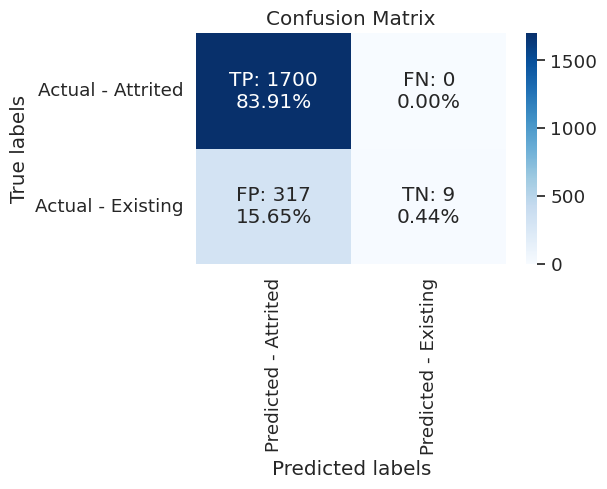

In [ ]:
make_confusion_matrix(lr_tuned_model, X_val, y_val)

# Tuning the second best model (Gradient Boosting Classifier with original dataset):
**Tuning Gradient Boosting Classifier with the original dataset**

# **Getting the best parameter for tuning the model:**

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import GradientBoostingClassifier
from sklearn import metrics
import numpy as np

# Define the model
gbc_model = GradientBoostingClassifier(random_state=1)

# Define the parameter grid
param_grid_gbc = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'subsample': [0.5, 0.7, 1.0],
}

# Define the scoring metric
scorer = metrics.make_scorer(metrics.recall_score)

# Define RandomizedSearchCV with reduced iterations and CV folds
gbc_tuned = RandomizedSearchCV(
    estimator=gbc_model,
    param_distributions=param_grid_gbc,
    n_iter=10,
    scoring=scorer,
    cv=5,
    random_state=42,
    n_jobs=-1
)

# Fit the RandomizedSearchCV
gbc_tuned.fit(X_train, y_train.values.ravel())

print("Best parameters are {} with CV score={}".format(gbc_tuned.best_params_, gbc_tuned.best_score_))

Best parameters are {'subsample': 0.5, 'n_estimators': 50, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_depth': 3, 'learning_rate': 0.01} with CV score=1.0


# Tuning the Second best model (GBC with original dataset):
**Building the GBC model with the  tuned/best parameters from the RandomizedSearchCV Techniques:**

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import cross_val_score

# Define the best parameters obtained from hyperparameter tuning
best_params_gbc = {
    'subsample': 0.5,
    'n_estimators': 50,
    'min_samples_split': 10,
    'min_samples_leaf': 4,
    'max_depth': 3,
    'learning_rate': 0.01
}

# Build Gradient Boosting Classifier model with best parameters
gbc_tuned_model = GradientBoostingClassifier(**best_params_gbc, random_state=1)

# Perform cross-validation
cv_scores = cross_val_score(gbc_tuned_model, X_train, y_train.values.ravel(), cv=5)

# Fit the model on the entire training data
gbc_tuned_model.fit(X_train, y_train.values.ravel())

GradientBoostingClassifier(learning_rate=0.01, min_samples_leaf=4,
                           min_samples_split=10, n_estimators=50,
                           random_state=1, subsample=0.5)

# Getting CV Score:

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.metrics import recall_score

# Create and train the Gradient Boosting Classifier model
gbc_tuned_model = GradientBoostingClassifier(learning_rate=0.01, min_samples_leaf=4,
                                             min_samples_split=10, n_estimators=50,
                                             random_state=1, subsample=0.5)
gbc_tuned_model.fit(X_train, y_train.values.ravel())

# Get evaluation metrics scores
recall_gbc_train = recall_score(y_train, gbc_tuned_model.predict(X_train))
recall_gbc_val = recall_score(y_val, gbc_tuned_model.predict(X_val))

# Perform cross-validation with StratifiedKFold
kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)
gbc_original_cv = cross_val_score(estimator=gbc_tuned_model, X=X_train, y=y_train.values.ravel(), scoring="recall", cv=kfold)

# Print evaluation metrics scores
print("Gradient Boosting Classifier Tuned with original dataset:")
print(f"Train Recall: {recall_gbc_train:.4f}")
print(f"Validation Recall: {recall_gbc_val:.4f}")
print(f"Cross-Validation Mean Recall: {gbc_original_cv.mean():.4f}")

Gradient Boosting Classifier Tuned with original dataset:
Train Recall: 1.0000
Validation Recall: 1.0000
Cross-Validation Mean Recall: 1.0000


# **Getting Confusion matrix on validation dataset:**

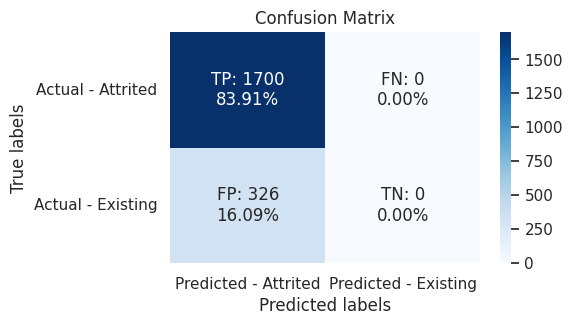

In [ ]:
make_confusion_matrix(gbc_tuned_model, X_val, y_val)

# Tuning the third best model (Xgboost Classifier with the original dataset):
**Tuning Xgboost Classifier with the original dataset**

# **Getting the best parameter for tuning the Xgboost Classifier model:**

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from xgboost import XGBClassifier
from sklearn import metrics
import numpy as np

# Define the model
xgb_model = XGBClassifier(random_state=1)

# Define the parameter grid with reduced search space
param_grid_xgb = {
    'n_estimators': np.arange(50, 201, 50),
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5],
}

# Define the scoring metric
scorer = metrics.make_scorer(metrics.recall_score)

# Define RandomizedSearchCV with reduced iterations and CV folds
xgb_tuned = RandomizedSearchCV(
    estimator=xgb_model,
    param_distributions=param_grid_xgb,
    n_iter=10,  # Reduced number of iterations
    scoring=scorer,
    cv=5,
    random_state=42,
    n_jobs=-1
)

# Fit the RandomizedSearchCV
xgb_tuned.fit(X_train, y_train)

print("Best parameters are {} with CV score={}".format(xgb_tuned.best_params_, xgb_tuned.best_score_))

Best parameters are {'n_estimators': 50, 'max_depth': 5, 'learning_rate': 0.01} with CV score=1.0


# Tuning the third best model (Xgboost with original dataset):
**Building the Xgboost model with the  tuned/best parameters from the RandomizedSearchCV Techniques:**

In [ ]:
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score

# Define the best parameters obtained from hyperparameter tuning
best_params_xgb = {
    'subsample': 0.5,
    'n_estimators': 50,
    'max_depth': 3,
    'learning_rate': 0.01
}

# Build XGBoost Classifier model with best parameters
xgb_tuned_model = XGBClassifier(**best_params_xgb, random_state=1)

# Perform cross-validation
cv_scores = cross_val_score(xgb_tuned_model, X_train, y_train, cv=5)

# Fit the model on the entire training data
xgb_tuned_model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.01, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=3, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=50, n_jobs=None,
              num_parallel_tree=None, random_state=1, ...)

# **Getting CV Score:**

In [ ]:
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.metrics import recall_score

# Create and train the XGBoost Classifier model
xgb_tuned_model = XGBClassifier(learning_rate=0.01, n_estimators=50,
                                 max_depth=3, subsample=0.5, random_state=1)
xgb_tuned_model.fit(X_train, y_train)

# Get evaluation metrics scores
recall_xgb_train = recall_score(y_train, xgb_tuned_model.predict(X_train))
recall_xgb_val = recall_score(y_val, xgb_tuned_model.predict(X_val))

# Perform cross-validation with StratifiedKFold
kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)
xgb_cv = cross_val_score(estimator=xgb_tuned_model, X=X_train, y=y_train, scoring="recall", cv=kfold)

# Print evaluation metrics scores
print("XGBoost Classifier Tuned with original dataset:")
print(f"Train Recall: {recall_xgb_train:.4f}")
print(f"Validation Recall: {recall_xgb_val:.4f}")
print(f"Cross-Validation Mean Recall: {xgb_cv.mean():.4f}")

XGBoost Classifier Tuned with original dataset:
Train Recall: 1.0000
Validation Recall: 1.0000
Cross-Validation Mean Recall: 1.0000


# **Getting Confusion matrix on validation dataset:**

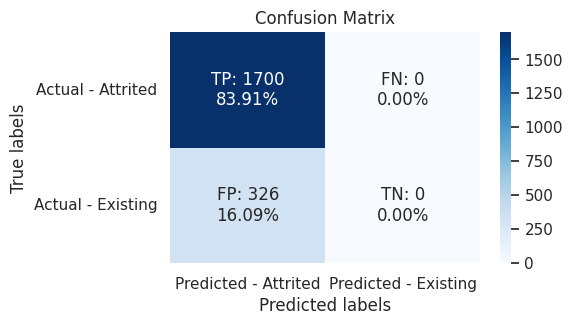

In [ ]:
make_confusion_matrix(xgb_tuned_model, X_val, y_val)

# **Logistic regression with the oversampled dataset**

# Tuning the fourth best model (Logistic regression with the oversampled dataset):
**Tuning Logistic regression with the oversampled dataset**

# **Getting the best parameter for tuning the Logistic regression model with the oversampled dataset :**

In [ ]:
%%time

import warnings
from sklearn.model_selection import RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn import metrics

# Suppress warnings
warnings.filterwarnings("ignore")

# Define logistic regression model
lr_model_over = LogisticRegression(random_state=1, solver='lbfgs', max_iter=1000)

# Parameter grid for hyperparameter tuning
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],  # Regularization parameter
    'class_weight': [{0: 16, 1: 84}, {0: 1, 1: 1}, {0: 1, 1: 5}],  # Class weights
    'solver': ['lbfgs', 'liblinear']  # Solver algorithm
}

# Scorer for evaluation
scorer = metrics.make_scorer(metrics.recall_score)

# Randomized search with cross-validation
lr_tuned_over = RandomizedSearchCV(estimator=lr_model_over, param_distributions=param_grid, n_iter=36,
                              scoring=scorer, cv=10, random_state=42, n_jobs=-1)

# Fit hyperparameters
lr_tuned_over.fit(X_train_over, y_train_over)

# Print best parameters and CV score
print("Best parameters are {} with CV score={}".format(lr_tuned_over.best_params_, lr_tuned_over.best_score_))

Best parameters are {'solver': 'lbfgs', 'class_weight': {0: 1, 1: 5}, 'C': 0.01} with CV score=0.975878115489811
CPU times: user 4.38 s, sys: 1.41 s, total: 5.79 s
Wall time: 2min 19s


# Tuning the fourth best model (Logistic regression with the oversampled dataset):
**Building the Logistic regression with the oversampled dataset with the  tuned/best parameters from the RandomizedSearchCV Techniques:**

In [ ]:
from sklearn.linear_model import LogisticRegression

# Best parameters obtained from hyperparameter tuning
best_params = {
    'solver': 'lbfgs',
    'class_weight': {0: 1, 1: 5},
    'C': 0.01
}

# Build Logistic Regression model with best parameters
lr_tuned_over_model = LogisticRegression(**best_params, max_iter=1000, random_state=1)

# Fit the model on oversampled training data
lr_tuned_over_model.fit(X_train_over, y_train_over)

LogisticRegression(C=0.01, class_weight={0: 1, 1: 5}, max_iter=1000,
                   random_state=1)

# **Getting CV Score:**

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.metrics import recall_score

# Create and train the Logistic Regression model with oversampled data
lr_tuned_over_model = LogisticRegression(C=0.001, class_weight={0: 16, 1: 84}, max_iter=1000, random_state=1, solver='liblinear')
lr_tuned_over_model.fit(X_train_over, y_train_over)

# Get evaluation metrics scores
recall_lr_train_over = recall_score(y_train_over, lr_tuned_over_model.predict(X_train_over))
recall_lr_val_over = recall_score(y_val, lr_tuned_over_model.predict(X_val))

# Perform cross-validation with StratifiedKFold
kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=1)
scoring = "recall"
lr_over_cv = cross_val_score(estimator=lr_tuned_over_model, X=X_train_over, y=y_train_over, scoring=scoring, cv=kfold)

# Print evaluation metrics scores
print("Logistic Regression Tuned with oversampled data:")
print(f"Train Recall: {recall_lr_train_over:.4f}")
print(f"Validation Recall: {recall_lr_val_over:.4f}")
print(f"Cross-Validation Mean Recall: {lr_over_cv.mean():.4f}")

Logistic Regression Tuned with oversampled data:
Train Recall: 0.9708
Validation Recall: 0.9765
Cross-Validation Mean Recall: 0.9716


# **Getting Confusion matrix on validation dataset:**

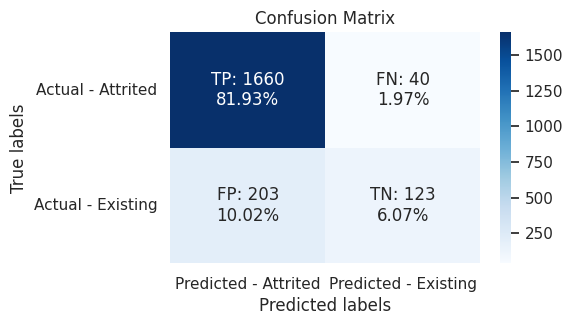

In [ ]:
make_confusion_matrix(lr_tuned_over_model, X_val, y_val)

# **Comparing the best Models after hypertuned parameter:**

In [151]:
best_df1=evaluation_df.iloc[[0, 2, 4]] # derived from the original LR model
best_df2=evaluation_df_over.iloc[[0]] #derived from the oversampled LR model
combined_best_df=pd.concat([best_df1, best_df2], axis=0)
combined_best_df.sort_values(by=['Test_Recall','Cross_Val_Score_Train'],ascending=False)
combined_best_df.reset_index(drop=True, inplace=True)
styled_df_compare = combined_best_df.style.apply(highlight_max_min, subset=['Cross_Val_Score_Train', 'Train_Accuracy',
                                                                              'Test_Accuracy', 'Train_Recall', 'Test_Recall',
                                                                              'Train_Precision', 'Test_Precision', 'Train_F1',
                                                                              'Test_F1', 'Train_ROC_AUC', 'Test_ROC_AUC'], axis=None)
# Display the sorted DataFrame
styled_df_compare

,Model,Cross_Val_Score_Train,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1,Test_F1,Train_ROC_AUC,Test_ROC_AUC
0,LR,0.994705,0.871440,0.874630,0.996470,0.998824,0.869439,0.870835,0.928630,0.930449,0.607354,0.611720
1,GBC,0.989213,0.978930,0.965449,0.994116,0.991182,0.981033,0.968409,0.987532,0.979663,0.946853,0.910975
2,Xgboost,0.986664,1.000000,0.967423,1.000000,0.987066,1.000000,0.974463,1.000000,0.980724,1.000000,0.925841
3,LR_over,0.975093,0.752893,0.890918,0.974701,0.980600,0.675180,0.898707,0.797753,0.937869,0.752893,0.701069


# **Choosing the best Final Model Selection:**

Based on the specific requirements of my problem (e.g., emphasis on avoiding false negatives, minimizing false positives, overall model performance), I choose the XGBoost Classifier as the best model.


# **Checking the Test Data on XGBoost Classifier with Original dataset**

Since feature importance analysis is typically performed after training a machine learning model to understand which features or variables have the most significant impact on the model's predictions, I am going to implement the feature importance identifying the most relevant features for prediction and removing less important features to reduce overfitting, and improve generalization performance of the best selected model.

# **Visualizing the Feature Importance for the best model**
There are several methods to determine feature importance in machine learning models. Each method has its strengths and weaknesses, and the choice of method depends on factors such as the type of model, the interpretability of results, and the nature of the dataset.

In [152]:
xgboost_best = XGBClassifier(random_state=1, eval_metric="logloss")

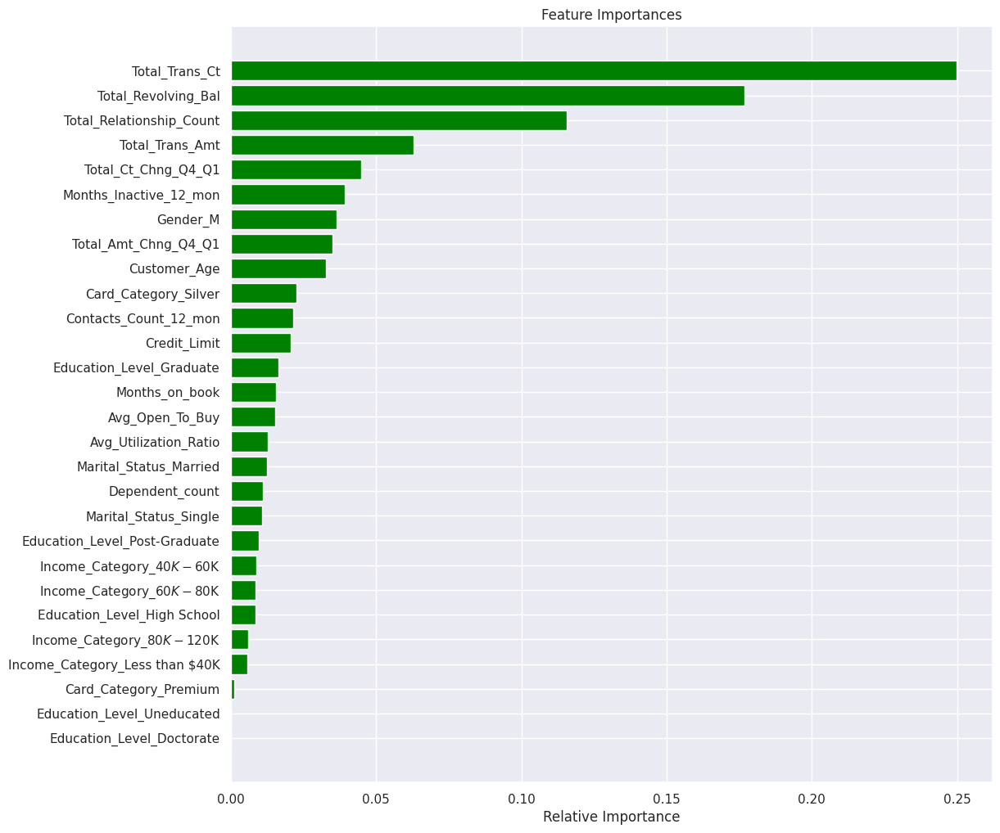

In [157]:
import xgboost as xgb
import matplotlib.pyplot as plt

# Assuming you have already defined and initialized your XGBoost model as xgboost_best
# Fit the XGBoost model using training data and labels
xgboost_best.fit(X_train, y_train)

# Get feature importances from the trained XGBoost model
importances = xgboost_best.feature_importances_

# Get feature names (assuming X_train.columns contains feature names)
feature_names = X_train.columns

# Sort indices based on importances
indices = importances.argsort()

# Create a horizontal bar plot to visualize feature importances
plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="green", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()


In [161]:
import xgboost as xgb
import matplotlib.pyplot as plt

# Assuming you have already defined and initialized your XGBoost model as xgboost_best
# Fit the XGBoost model using training data and labels
xgboost_best.fit(X, y_df)

# Get feature importances from the trained XGBoost model
importances = xgboost_best.feature_importances_

# Get feature names (assuming X_train.columns contains feature names)
feature_names = X.columns

# Sort indices based on importances
indices = importances.argsort()

# Create a horizontal bar plot to visualize feature importances
plt.figure(figsize=(12, 12))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="violet", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()


ValueError: DataFrame.dtypes for data must be int, float, bool or category. When categorical type is supplied, The experimental DMatrix parameter`enable_categorical` must be set to `True`.  Invalid columns:Gender: object, Education_Level: object, Marital_Status: object, Income_Category: object, Card_Category: object